In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import re

In [6]:
def extract_integer(value):
    match = re.search(r'\d+', str(value))
    return int(match.group()) if match else 0

data['Downloads (30 days)'] = data['Downloads (30 days)'].apply(extract_integer)


In [5]:
import re
import pandas as pd

# --- Load Gutenberg dataset ---
data = pd.read_csv(r'Favorites/Links/gutenberg_400_books.csv', on_bad_lines="skip")

# ✅ Clean column names (remove spaces, tabs, line breaks)
data.columns = data.columns.str.strip()

# --- Step 1: Clean Downloads column ---
def extract_integer(value):
    match = re.search(r'\d+', str(value))
    return int(match.group()) if match else 0

if "Downloads (30 days)" in data.columns:
    data["Downloads (30 days)"] = data["Downloads (30 days)"].apply(extract_integer)

# --- Step 2: Define expected format keys ---
expected_keys = [
    'Read now!',
    'EPUB3 (E-readers incl. Send-to-Kindle)',
    'EPUB (older E-readers)',
    'EPUB (no images, older E-readers)',
    'Kindle',
    'older Kindles',
    'Plain Text UTF-8',
    'Download HTML (zip)'
]

# --- Step 3: Convert file size into chosen unit ---
UNIT = "KB"   # 🔹 change to "MB" if you want MB instead

def convert_size(size_str, unit=UNIT):
    if pd.isna(size_str):
        return None
    match = re.match(r"([\d.]+)\s*(kB|MB)", str(size_str))
    if not match:
        return None
    value, original_unit = float(match.group(1)), match.group(2)

    # Convert everything into KB
    if original_unit == "MB":
        value = value * 1024  # MB → KB

    if unit == "MB":
        return round(value / 1024, 2)  # KB → MB
    else:
        return round(value, 2)         # Keep KB

# --- Step 4: Extract file-size dictionary from text ---
def extract_sizes(entry):
    if pd.isna(entry):   # handle missing values
        return {}
    entry = str(entry).replace('\xa0', ' ')
    matches = re.findall(r'([^:;]+):\s*([\d.]+\s?(?:kB|MB))', entry)
    return {k.strip(): v.strip() for k, v in matches}

# --- Step 5: Parse the 'File Sizes' column ---
format_column = "File Sizes"

if format_column in data.columns:
    sizes_df = pd.DataFrame([extract_sizes(entry) for entry in data[format_column]])
    sizes_df = sizes_df.reindex(columns=expected_keys)

    # ✅ Convert all to chosen unit
    for col in sizes_df.columns:
        sizes_df[col] = sizes_df[col].apply(lambda x: convert_size(x, UNIT))

    # ✅ Rename columns with unit
    sizes_df.rename(columns={col: f"{col} ({UNIT})" for col in sizes_df.columns}, inplace=True)

    # Concatenate horizontally
    final_df = pd.concat([data, sizes_df], axis=1)
else:
    print("⚠️ Column 'File Sizes' not found. Available columns:", data.columns.tolist())
    final_df = data.copy()

# --- Step 6: Select required columns ---
keep_columns = [
    "Title", "Author", "Book ID", "Book Page",
    "Downloads (30 days)", "Language", "Subject",
    "Release Date"
] + list(sizes_df.columns)

final_df = final_df[[col for col in keep_columns if col in final_df.columns]]

# --- Step 7: Show result ---
pd.set_option("display.max_columns", None)
pd.set_option("display.width", 200)
final_df


,Title,Author,Book ID,Book Page,Downloads (30 days),Language,Release Date,Read now! (KB),EPUB3 (E-readers incl. Send-to-Kindle) (KB),EPUB (older E-readers) (KB),"EPUB (no images, older E-readers) (KB)",Kindle (KB),older Kindles (KB),Plain Text UTF-8 (KB),Download HTML (zip) (KB)
0,"Moby Dick; Or, The Whale",Herman Melville,2701,https://www.gutenberg.org/ebooks/2701,115756,English,"Jul 1, 2001",1433.6,797.0,821.0,715.0,1228.8,1024.0,1228.8,1024.0
1,"Frankenstein; Or, The Modern Prometheus",Mary Wollstonecraft Shelley,84,https://www.gutenberg.org/ebooks/84,103540,English,"Oct 1, 1993",457.0,465.0,465.0,350.0,667.0,639.0,438.0,789.0
2,Romeo and Juliet,William Shakespeare,1513,https://www.gutenberg.org/ebooks/1513,81368,English,"Nov 1, 1998",217.0,522.0,521.0,196.0,822.0,798.0,166.0,488.0
3,Pride and Prejudice,Jane Austen,1342,https://www.gutenberg.org/ebooks/1342,67731,English,"Jun 1, 1998",833.0,24268.8,24268.8,548.0,24780.8,24678.4,754.0,24678.4
4,A Room with a View,E. M. Forster,2641,https://www.gutenberg.org/ebooks/2641,58960,English,"May 1, 2001",440.0,444.0,443.0,250.0,558.0,536.0,406.0,407.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
395,The Tempest,William Shakespeare,23042,https://www.gutenberg.org/ebooks/23042,4929,English,"Oct 26, 2007",302.0,232.0,237.0,203.0,684.0,644.0,170.0,335.0
396,Roughing It,Mark Twain,3177,https://www.gutenberg.org/ebooks/3177,4924,English,"Jul 3, 2004",1126.4,21401.6,21401.6,560.0,21606.4,21504.0,973.0,20992.0
397,Macbeth,William Shakespeare,1533,https://www.gutenberg.org/ebooks/1533,4922,English,"Nov 1, 1998",170.0,485.0,483.0,180.0,768.0,748.0,127.0,454.0
398,A Midsummer Night's Dream,William Shakespeare,1514,https://www.gutenberg.org/ebooks/1514,4914,English,"Nov 1, 1998",154.0,520.0,518.0,185.0,808.0,790.0,118.0,477.0


In [59]:
# Suppose your DataFrame is named df
df.to_csv('books_data.csv', index=False)


In [8]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 400 entries, 0 to 399
Data columns (total 10 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   Title                400 non-null    object
 1   Author               400 non-null    object
 2   Book ID              400 non-null    int64 
 3   Book Page            400 non-null    object
 4   Downloads (30 days)  400 non-null    int64 
 5   Language             400 non-null    object
 6   Subjects             400 non-null    object
 7   Availability         400 non-null    object
 8   File Sizes           400 non-null    object
 9   Release Date         400 non-null    object
dtypes: int64(2), object(8)
memory usage: 31.4+ KB


### checking the description of the data 

In [9]:
data.describe()

,Book ID,Downloads (30 days)
count,400.000000,400.000000
mean,17024.572500,12762.512500
std,20474.964294,12871.588426
min,10.000000,4903.000000
25%,1258.500000,6075.750000
50%,6084.000000,8216.500000
75%,28455.750000,13428.000000
max,76806.000000,115756.000000


In [10]:
data.describe(include = 'object')

,Title,Author,Book Page,Language,Subjects,Availability,File Sizes,Release Date
count,400,400,400,400,400,400,400,400
unique,394,250,399,10,353,6,399,293
top,"Frankenstein; Or, The Modern Prometheus",Unknown,https://www.gutenberg.org/ebooks/2554,English,Romances,; Read now!; EPUB3 (E-readers incl. Send-to-Ki...,Read now!: 1.3 MB; EPUB3 (E-readers incl. Send...,"Mar 1, 1998"
freq,3,16,2,380,5,315,2,6


In [11]:
data.duplicated().sum()

np.int64(1)

In [12]:
data.duplicated()

0      False
1      False
2      False
3      False
4      False
       ...  
395    False
396    False
397    False
398    False
399    False
Length: 400, dtype: bool

In [13]:
data.drop_duplicates()

,Title,Author,Book ID,Book Page,Downloads (30 days),Language,Subjects,Availability,File Sizes,Release Date
0,"Moby Dick; Or, The Whale",Herman Melville,2701,https://www.gutenberg.org/ebooks/2701,115756,English,Whaling ships -- Fiction,; Read now!; EPUB3 (E-readers incl. Send-to-Ki...,Read now!: 1.4 MB; EPUB3 (E-readers incl. Send...,"Jul 1, 2001"
1,"Frankenstein; Or, The Modern Prometheus",Mary Wollstonecraft Shelley,84,https://www.gutenberg.org/ebooks/84,103540,English,Frankenstein's monster (Fictitious character) ...,; Read now!; EPUB3 (E-readers incl. Send-to-Ki...,Read now!: 457 kB; EPUB3 (E-readers incl. Send...,"Oct 1, 1993"
2,Romeo and Juliet,William Shakespeare,1513,https://www.gutenberg.org/ebooks/1513,81368,English,Tragedies (Drama),; Read now!; EPUB3 (E-readers incl. Send-to-Ki...,Read now!: 217 kB; EPUB3 (E-readers incl. Send...,"Nov 1, 1998"
3,Pride and Prejudice,Jane Austen,1342,https://www.gutenberg.org/ebooks/1342,67731,English,Social classes -- Fiction,; Read now!; EPUB3 (E-readers incl. Send-to-Ki...,Read now!: 833 kB; EPUB3 (E-readers incl. Send...,"Jun 1, 1998"
4,A Room with a View,E. M. Forster,2641,https://www.gutenberg.org/ebooks/2641,58960,English,Florence (Italy) -- Fiction,; Read now!; EPUB3 (E-readers incl. Send-to-Ki...,Read now!: 440 kB; EPUB3 (E-readers incl. Send...,"May 1, 2001"
...,...,...,...,...,...,...,...,...,...,...
395,The Tempest,William Shakespeare,23042,https://www.gutenberg.org/ebooks/23042,4929,English,Tragicomedy,; Read now!; EPUB3 (E-readers incl. Send-to-Ki...,Read now!: 302 kB; EPUB3 (E-readers incl. Send...,"Oct 26, 2007"
396,Roughing It,Mark Twain,3177,https://www.gutenberg.org/ebooks/3177,4924,English,West (U.S.) -- Intellectual life -- 19th century,; Read now!; EPUB3 (E-readers incl. Send-to-Ki...,Read now!: 1.1 MB; EPUB3 (E-readers incl. Send...,"Jul 3, 2004"
397,Macbeth,William Shakespeare,1533,https://www.gutenberg.org/ebooks/1533,4922,English,Scotland -- Kings and rulers -- Drama,; Read now!; EPUB3 (E-readers incl. Send-to-Ki...,Read now!: 170 kB; EPUB3 (E-readers incl. Send...,"Nov 1, 1998"
398,A Midsummer Night's Dream,William Shakespeare,1514,https://www.gutenberg.org/ebooks/1514,4914,English,Fairy plays,; Read now!; EPUB3 (E-readers incl. Send-to-Ki...,Read now!: 154 kB; EPUB3 (E-readers incl. Send...,"Nov 1, 1998"


In [14]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 400 entries, 0 to 399
Data columns (total 10 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   Title                400 non-null    object
 1   Author               400 non-null    object
 2   Book ID              400 non-null    int64 
 3   Book Page            400 non-null    object
 4   Downloads (30 days)  400 non-null    int64 
 5   Language             400 non-null    object
 6   Subjects             400 non-null    object
 7   Availability         400 non-null    object
 8   File Sizes           400 non-null    object
 9   Release Date         400 non-null    object
dtypes: int64(2), object(8)
memory usage: 31.4+ KB


In [15]:
data.columns

Index(['Title', 'Author', 'Book ID', 'Book Page', 'Downloads (30 days)', 'Language', 'Subjects', 'Availability', 'File Sizes', 'Release Date'], dtype='object')

In [16]:
data['Title'].unique()

array(['Moby Dick; Or, The Whale',
       'Frankenstein; Or, The Modern Prometheus', 'Romeo and Juliet',
       'Pride and Prejudice', 'A Room with a View',
       'The Complete Works of William Shakespeare', 'Middlemarch',
       "Alice's Adventures in Wonderland",
       'How to Observe: Morals and Manners',
       'Little Women; Or, Meg, Jo, Beth, and Amy', 'The Enchanted April',
       'Beowulf: An Anglo-Saxon Epic Poem', 'The Blue Castle: a novel',
       'Dracula', 'Cranford', 'The Expedition of Humphry Clinker',
       'The Adventures of Ferdinand Count Fathom — Complete',
       'History of Tom Jones, a Foundling', 'Twenty years after',
       'The Strange Case of Dr. Jekyll and Mr. Hyde',
       'The Adventures of Roderick Random', 'My Life — Volume 1',
       'Society in America, Volume 1 (of 2)',
       'The Philosophy of Auguste Comte', 'Crime and Punishment',
       'The Picture of Dorian Gray', 'The Great Gatsby', 'Leviathan',
       'Jane Eyre: An Autobiography', 'Metamo

In [17]:
data['Author'].unique()

array(['Herman Melville', 'Mary Wollstonecraft Shelley',
       'William Shakespeare', 'Jane Austen', 'E. M. Forster',
       'George Eliot', 'Lewis Carroll', 'Harriet Martineau',
       'Louisa May Alcott', 'Elizabeth Von Arnim', 'Unknown',
       'L. M. Montgomery', 'Bram Stoker', 'Elizabeth Cleghorn Gaskell',
       'T. Smollett', 'Henry Fielding',
       'Alexandre Dumas and Auguste Maquet', 'Robert Louis Stevenson',
       'Richard Wagner', 'Lucien Lévy-Bruhl', 'Fyodor Dostoyevsky',
       'Oscar Wilde', 'F. Scott Fitzgerald', 'Thomas Hobbes',
       'Charlotte Brontë', 'Franz Kafka', 'Charles Dickens',
       'Jonathan Swift', 'Mark Twain', 'P. G. Wodehouse',
       'Jean de La Fontaine', 'Friedrich Wilhelm Nietzsche',
       'Niccolò Machiavelli', 'Homer', 'Jacob Grimm and Wilhelm Grimm',
       'Henrik Ibsen', 'graf Leo Tolstoy', 'John Locke', 'Emily Brontë',
       'Plato', 'Arthur Conan Doyle', 'Nathaniel Hawthorne',
       'Charlotte Perkins Gilman', 'Bishop of Hippo Saint A

In [18]:
data['Book ID'].unique()

array([ 2701,    84,  1513,  1342,  2641,   100,   145,    11, 33944,
       37106, 16389, 16328, 67979,   345,   394,  2160,  6761,  6593,
        1259,    43,  4085,  5197, 52621, 56517,  2554,   174, 64317,
        3207,  1260,  5200,    98,  1080,    76, 10554, 28054,  7241,
        1998,  1232,  6130,  2591,  2542,  2600,  7370,   768,  1184,
        1497,  1661, 25344,   844,  1952,  3296,   408,  4300,  8800,
        2148,   205,    45, 26184,  4351,    74, 36034,    23, 56877,
        1400,  2739,    46,  1727, 49266, 27320,  4363,    41, 72679,
        2000,  1228, 27827, 57821,  3206, 34901,    55,  2650, 15399,
        2911, 20203, 33283,  1399,    36, 52685,  1251,   135,  8438,
          16, 41445, 30254, 16833,  2680,   730,   219,   158,  3201,
         815,   829,    10, 15474,    12,  1023,   514,   120, 10007,
        7142, 18269,   600, 27673, 37683,  5827, 34206, 29728,   244,
       58585, 10676,  2852, 50280,  1600,    35,   996,   779,   161,
        3600,  4280,

In [19]:
data['Book Page'].unique()

array(['https://www.gutenberg.org/ebooks/2701',
       'https://www.gutenberg.org/ebooks/84',
       'https://www.gutenberg.org/ebooks/1513',
       'https://www.gutenberg.org/ebooks/1342',
       'https://www.gutenberg.org/ebooks/2641',
       'https://www.gutenberg.org/ebooks/100',
       'https://www.gutenberg.org/ebooks/145',
       'https://www.gutenberg.org/ebooks/11',
       'https://www.gutenberg.org/ebooks/33944',
       'https://www.gutenberg.org/ebooks/37106',
       'https://www.gutenberg.org/ebooks/16389',
       'https://www.gutenberg.org/ebooks/16328',
       'https://www.gutenberg.org/ebooks/67979',
       'https://www.gutenberg.org/ebooks/345',
       'https://www.gutenberg.org/ebooks/394',
       'https://www.gutenberg.org/ebooks/2160',
       'https://www.gutenberg.org/ebooks/6761',
       'https://www.gutenberg.org/ebooks/6593',
       'https://www.gutenberg.org/ebooks/1259',
       'https://www.gutenberg.org/ebooks/43',
       'https://www.gutenberg.org/ebooks/4085

In [20]:
data['Language'].unique()

array(['English', 'Spanish', 'French', 'Latin', 'Chinese', 'Portuguese',
       'German', 'Tagalog', 'Japanese', 'Middle English'], dtype=object)

In [21]:
data['File Sizes'].unique()

array(['Read now!: 1.4\xa0MB; EPUB3 (E-readers incl. Send-to-Kindle): 797\xa0kB; EPUB (older E-readers): 821\xa0kB; EPUB (no images, older E-readers): 715\xa0kB; Kindle: 1.2\xa0MB; older Kindles: 1.0\xa0MB; Plain Text UTF-8: 1.2\xa0MB; Download HTML (zip): 1.0\xa0MB',
       'Read now!: 457\xa0kB; EPUB3 (E-readers incl. Send-to-Kindle): 465\xa0kB; EPUB (older E-readers): 465\xa0kB; EPUB (no images, older E-readers): 350\xa0kB; Kindle: 667\xa0kB; older Kindles: 639\xa0kB; Plain Text UTF-8: 438\xa0kB; Download HTML (zip): 789\xa0kB',
       'Read now!: 217\xa0kB; EPUB3 (E-readers incl. Send-to-Kindle): 522\xa0kB; EPUB (older E-readers): 521\xa0kB; EPUB (no images, older E-readers): 196\xa0kB; Kindle: 822\xa0kB; older Kindles: 798\xa0kB; Plain Text UTF-8: 166\xa0kB; Download HTML (zip): 488\xa0kB',
       'Read now!: 833\xa0kB; EPUB3 (E-readers incl. Send-to-Kindle): 23.7\xa0MB; EPUB (older E-readers): 23.7\xa0MB; EPUB (no images, older E-readers): 548\xa0kB; Kindle: 24.2\xa0MB; older Kin

In [22]:
data['Release Date'].unique()

array(['Jul 1, 2001', 'Oct 1, 1993', 'Nov 1, 1998', 'Jun 1, 1998',
       'May 1, 2001', 'Jan 1, 1994', 'Jul 1, 1994', 'Jun 27, 2008',
       'Oct 5, 2010', 'Aug 16, 2011', 'Jul 29, 2005', 'Jul 19, 2005',
       'May 3, 2022', 'Oct 1, 1995', 'Jan 1, 1996', 'Apr 1, 2000',
       'Sep 9, 2004', 'Sep 1, 2004', 'Mar 1, 1998', 'May 1, 2003',
       'Feb 1, 2004', 'Jul 22, 2016', 'Feb 7, 2018', 'Mar 28, 2006',
       'Oct 1, 1994', 'Jan 17, 2021', 'May 1, 2002', 'Aug 17, 2005',
       'Oct 1, 1997', 'Jun 29, 2004', 'Jan 1, 2004', 'Feb 12, 2009',
       'Jan 1, 2005', 'Dec 1, 1999', 'Feb 11, 2006', 'Jul 1, 2004',
       'Apr 1, 2001', 'Mar 1, 2001', 'Dec 1, 1996', 'Jan 1, 1998',
       'Oct 1, 1998', 'Mar 1, 1999', 'May 5, 2008', 'Mar 1, 1997',
       'Nov 1, 1999', 'Jun 1, 2002', 'Jul 1, 2003', 'Sep 1, 2005',
       'Jan 1, 1995', 'Aug 4, 2008', 'Aug 1, 2003', 'May 5, 2011',
       'Jan 12, 2006', 'Mar 30, 2018', 'Jul 1, 1998', 'Aug 11, 2004',
       'Apr 1, 1999', 'Jun 23, 2015', 'Nov 24, 2

# Visualization 

## Univariate analysis

In [23]:
def numerical(data, column):
    print('-'*10 ,'Analysis of ',column, '-'*10)
    print(df[column].agg(['min','max','mean','median','std','skew','kurtosis']))
    print()
    #distribution
    plt.figure(figsize=(15,12))
    #Histogram
    plt.subplot(2,2,1)
    df[column].plot(kind= 'hist', bins =10)
    plt.title('Histogram')
    plt.xlabel(column)
    plt.ylabel('Frequency')
    #KDE
    plt.subplot(2,2,2)
    df[column].plot(kind= 'kde')
    plt.title('KDE')
    plt.xlabel(column)
    plt.ylabel('Frequency')
    #Box plot
    plt.subplot(2,2,3)
    df[column].plot(kind= 'box')
    plt.title('BOx Plot')
    #QQ plot
    plt.subplot(2,2,4)
    stats.probplot(df[column], dist= 'norm', plot= plt)
    plt.title('QQ Plot Normal Distribution ')

In [24]:
def extract_integer(value):
    match = re.search(r'\d+', str(value))
    return int(match.group()) if match else 0

data['Downloads (30 days)'] = data['Downloads (30 days)'].apply(extract_integer)


### Numeric columns 

In [25]:
numeric_cols = data.select_dtypes(include=['int64', 'float64']).columns

print("=== Summary statistics for numeric columns ===\n")
print(data[numeric_cols].describe())


=== Summary statistics for numeric columns ===

            Book ID  Downloads (30 days)
count    400.000000           400.000000
mean   17024.572500         12762.512500
std    20474.964294         12871.588426
min       10.000000          4903.000000
25%     1258.500000          6075.750000
50%     6084.000000          8216.500000
75%    28455.750000         13428.000000
max    76806.000000        115756.000000


### Histogram for Book ID and Downloads in 30 days

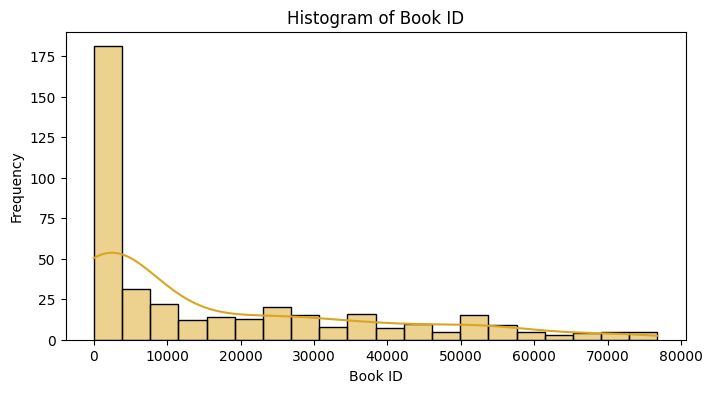

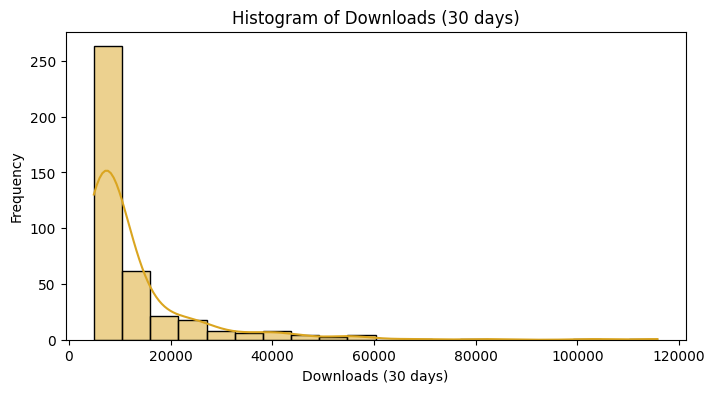

In [26]:
for col in numeric_cols:
    plt.figure(figsize=(8,4))
    sns.histplot(data[col], bins=20, kde=True, color='goldenrod')
    plt.title(f'Histogram of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.show()

### non visualized analysis for Histogram for Book ID and Downloads in 30 days

In [27]:
import numpy as np
import pandas as pd

hist_data = {}

for col in numeric_cols:
    # drop NaN for safety
    values = data[col].dropna()
    
    # compute histogram bins and counts
    counts, bin_edges = np.histogram(values, bins=20)
    
    # store as DataFrame for readability
    hist_data[col] = pd.DataFrame({
        "bin_start": bin_edges[:-1],
        "bin_end": bin_edges[1:],
        "count": counts
    })

# Example: show histogram data for first numeric column
for col, df in hist_data.items():
    print(f"\nHistogram data for {col}:")
    df.head()



Histogram data for Book ID:

Histogram data for Downloads (30 days):


### Boxplot for Book ID and Downloads in 30 days

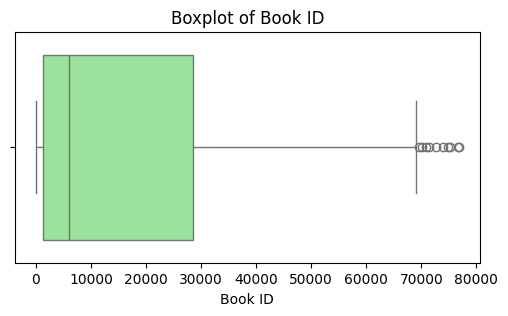

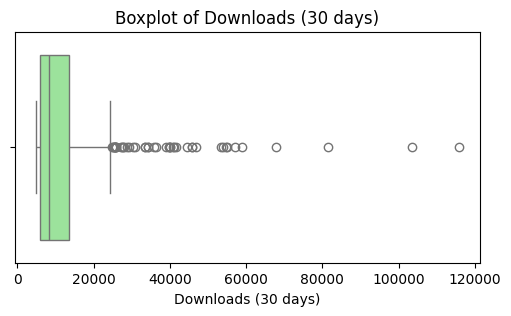

In [28]:
for col in numeric_cols:
    plt.figure(figsize=(6,3))
    sns.boxplot(x=data[col], color='lightgreen')
    plt.title(f'Boxplot of {col}')
    plt.show()

### Non visualization technique on box plot for book id and downloads in last 30 days

In [29]:
import pandas as pd

boxplot_data = {}

for col in numeric_cols:
    series = data[col].dropna()
    
    q1 = series.quantile(0.25)
    q3 = series.quantile(0.75)
    iqr = q3 - q1
    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr
    
    summary = {
        "min": series[series >= lower_bound].min(),
        "Q1": q1,
        "median": series.median(),
        "Q3": q3,
        "max": series[series <= upper_bound].max(),
        "IQR": iqr,
        "lower_bound": lower_bound,
        "upper_bound": upper_bound,
        "outliers": series[(series < lower_bound) | (series > upper_bound)].tolist()
    }
    
    boxplot_data[col] = summary

# Convert to DataFrame (excluding outliers for cleaner view)
boxplot_summary_df = pd.DataFrame(boxplot_data).T.drop(columns=["outliers"])

print("Boxplot summary (non-visualized):")
boxplot_summary_df


Boxplot summary (non-visualized):


,min,Q1,median,Q3,max,IQR,lower_bound,upper_bound
Book ID,10,1258.5,6084.0,28455.75,69087,27197.25,-39537.375,69251.625
Downloads (30 days),4903,6075.75,8216.5,13428.0,24219,7352.25,-4952.625,24456.375


### violin plot for Book ID and Downloads in 30 days

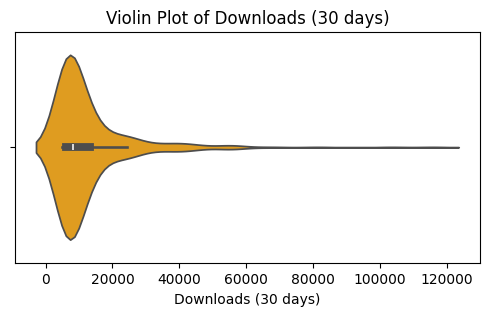

In [30]:
plt.figure(figsize=(6,3))
sns.violinplot(x=data[col], color='orange')
plt.title(f'Violin Plot of {col}')
plt.show()

### Non visualized analysis for violin plot for book id and downloads in 30 days

In [31]:
import numpy as np
from scipy.stats import gaussian_kde

kde_data = {}

for col in numeric_cols:
    series = data[col].dropna()
    kde = gaussian_kde(series)  # kernel density estimator
    
    # generate density values on a grid
    x_grid = np.linspace(series.min(), series.max(), 100)
    y_density = kde(x_grid)
    
    kde_data[col] = pd.DataFrame({
        "value": x_grid,
        "density": y_density
    })

# Example: show first KDE table for first numeric col
first_col = numeric_cols[0]
print(f"\nKDE (violin curve) data for {first_col}:")
kde_data[first_col].head()



KDE (violin curve) data for Book ID:


,value,density
0,10.000000,0.000033
1,785.717172,0.000034
2,1561.434343,0.000035
3,2337.151515,0.000035
4,3112.868687,0.000035


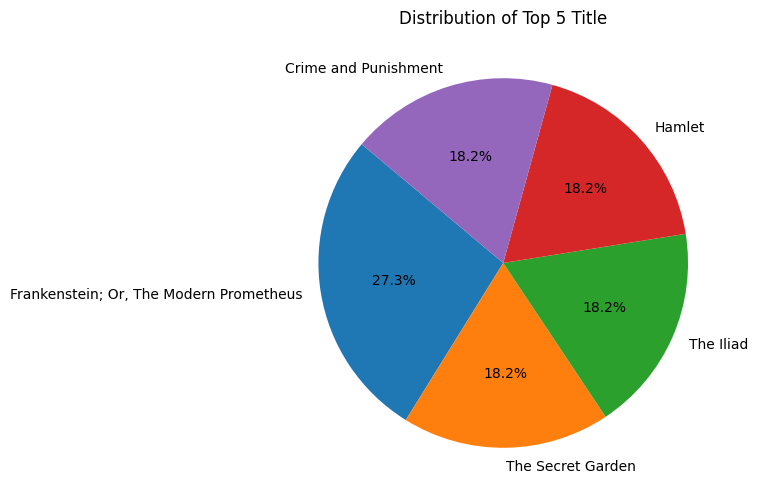

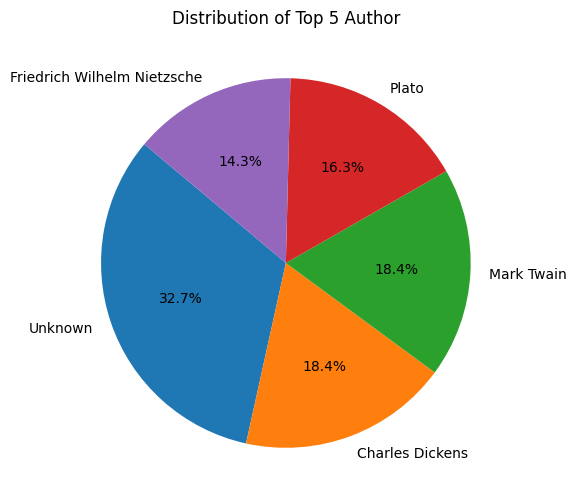

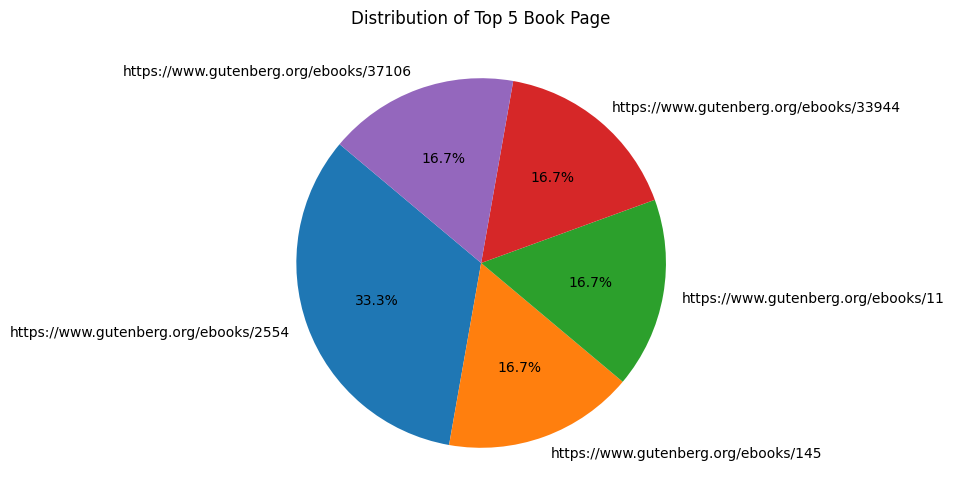

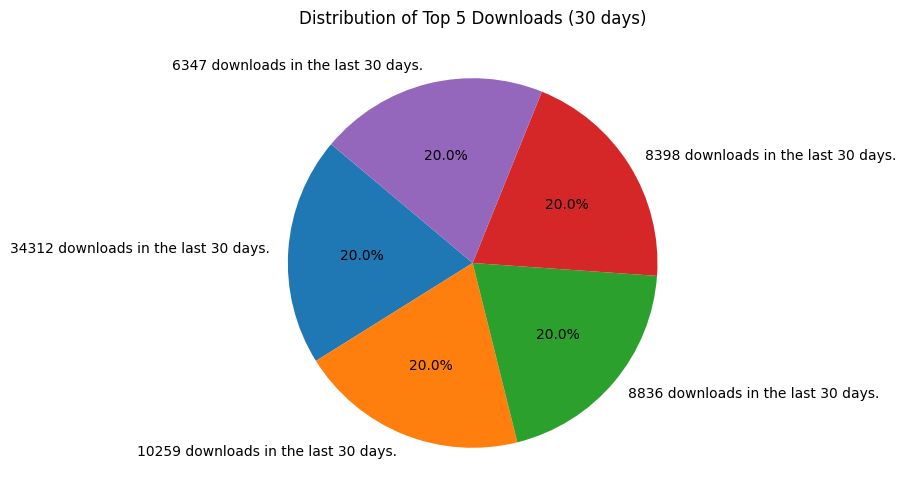

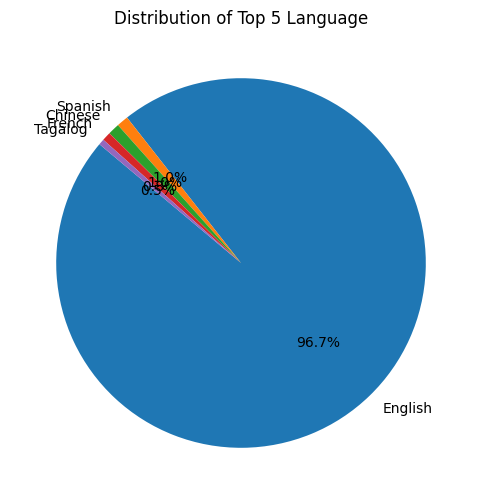

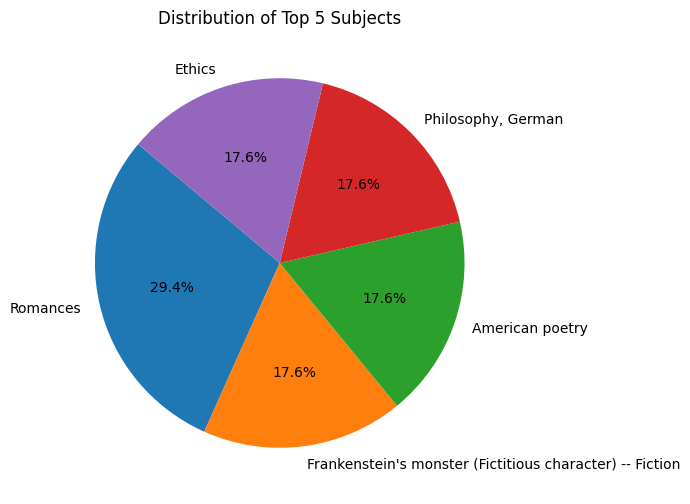

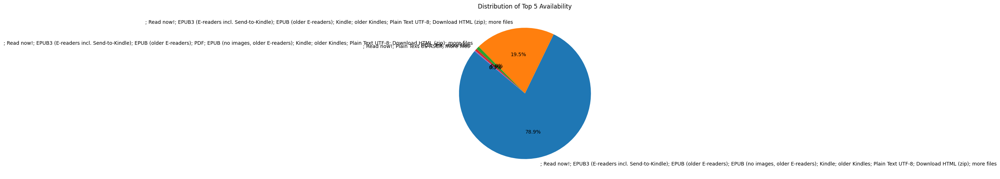

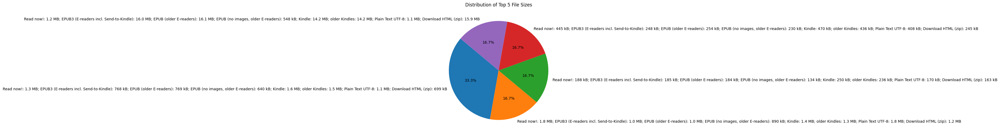

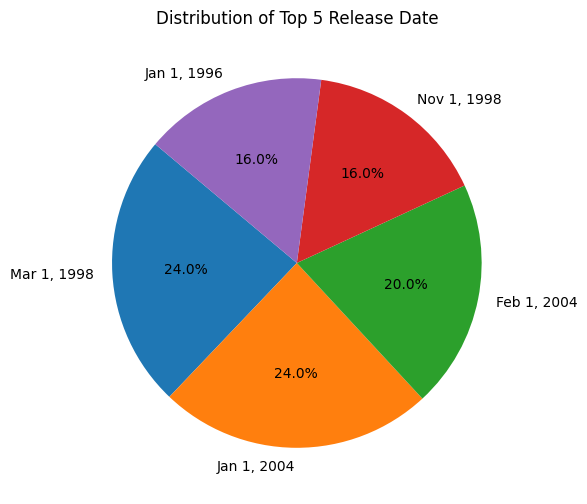

In [32]:
import matplotlib.pyplot as plt
import pandas as pd

# Load dataset
data = pd.read_csv(r'Favorites/Links/gutenberg_400_books.csv', on_bad_lines="skip")

# Identify categorical columns
categorical_cols = data.select_dtypes(include=['object']).columns.tolist()

# Plot pie charts for top 5 categories in each categorical column
for col in categorical_cols:
    top_values = data[col].value_counts().nlargest(5)  # Top 5 categories
    plt.figure(figsize=(6,6))
    plt.pie(top_values, labels=top_values.index, autopct='%1.1f%%', startangle=140)
    plt.title(f"Distribution of Top 5 {col}")
    plt.show()


### Non visualized analysis for distribution of top 5 title

In [33]:
import pandas as pd

# Load dataset
data = pd.read_csv(r'Favorites/Links/gutenberg_400_books.csv', on_bad_lines="skip")

# Identify categorical columns
categorical_cols = data.select_dtypes(include=['object']).columns.tolist()

# Store analysis in a dictionary
categorical_analysis = {}

for col in categorical_cols:
    # Top 5 categories
    top_values = data[col].value_counts().nlargest(5)
    
    # Calculate percentages
    percentages = (top_values / top_values.sum() * 100).round(2)
    
    # Combine into a DataFrame
    top_df = pd.DataFrame({
        'Category': top_values.index,
        'Count': top_values.values,
        'Percentage': percentages.values
    })
    
    categorical_analysis[col] = top_df
    print(f"\nTop 5 categories for column '{col}':")
    top_df



Top 5 categories for column 'Title':

Top 5 categories for column 'Author':

Top 5 categories for column 'Book Page':

Top 5 categories for column 'Downloads (30 days)':

Top 5 categories for column 'Language':

Top 5 categories for column 'Subjects':

Top 5 categories for column 'Availability':

Top 5 categories for column 'File Sizes':

Top 5 categories for column 'Release Date':


## univariate analysis for categorical column 

In [34]:
def categorical(discrete_data, column_name):
    if column_name in discrete_data.columns:
        print("*" * 10, column_name, "*" * 10)
        print(discrete_data[column_name].agg(['count', 'nunique', 'unique']))
        print("Value Counts (Normalized): \n", discrete_data[column_name].value_counts(normalize=True))
        print()
        print('-'*10 ,'Analysis of ',column_name, '-'*10)

        # Bar Plot
        plt.figure(figsize=(10, 6))  # Create a new figure for the bar plot
        discrete_data[column_name].value_counts().plot(kind='bar', alpha=0.7, color='skyblue')
        plt.title(f'Bar Plot of {column_name}')
        plt.xlabel(column_name)
        plt.ylabel('Count')
        plt.show()  # Show the plot after creating it

        # Count Plot
        plt.figure(figsize=(10, 6))  # Create a new figure for the count plot
        sns.countplot(x=discrete_data[column_name], palette='Set2')
        plt.title(f'Count Plot of {column_name}')
        plt.xlabel(column_name)
        plt.ylabel('Count')
        plt.show()  # Show the plot after creating it

        # Pie Chart
        plt.figure(figsize=(8, 8))  # Create a new figure for the pie chart
        discrete_data[column_name].value_counts().plot(kind='pie', autopct='%1.1f%%', startangle=90, cmap='Set3')
        plt.title(f'Pie Chart of {column_name}')
        plt.ylabel('')  # Hide the y-label for pie chart
        plt.show()  # Show the plot after creating it


### count plot for top 10 categories in release date

C:\Users\Hp\AppData\Local\Temp\ipykernel_23272\1504641690.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=top_values.values, y=top_values.index, palette='tab10')


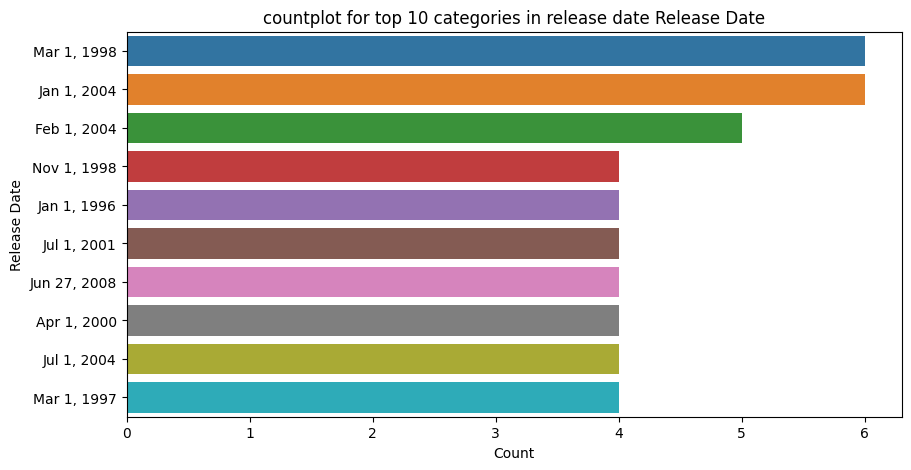

In [35]:
plt.figure(figsize=(10,5))
top_values = data[col].value_counts().nlargest(10)  # Top 10
sns.barplot(x=top_values.values, y=top_values.index, palette='tab10')
plt.title(f"countplot for top 10 categories in release date {col}")
plt.xlabel("Count")
plt.ylabel(col)
plt.show()


### Non visualized analysis for top 10 categories in release date

In [36]:
import pandas as pd

# Example categorical column
# Replace `col` with your actual column name
col = "Language"  # or any categorical column in your dataset

# Top 10 categories
top_values = data[col].value_counts().nlargest(10)

# Calculate percentages
percentages = (top_values / top_values.sum() * 100).round(2)

# Combine into DataFrame
top10_df = pd.DataFrame({
    "Category": top_values.index,
    "Count": top_values.values,
    "Percentage": percentages.values
})

print(f"Top 10 categories for column '{col}':")
print(top10_df)


Top 10 categories for column 'Language':
         Category  Count  Percentage
0         English    380       95.00
1         Spanish      4        1.00
2         Chinese      4        1.00
3          French      3        0.75
4         Tagalog      2        0.50
5          German      2        0.50
6        Japanese      2        0.50
7           Latin      1        0.25
8      Portuguese      1        0.25
9  Middle English      1        0.25


### pie chart for distribution of top 5 title

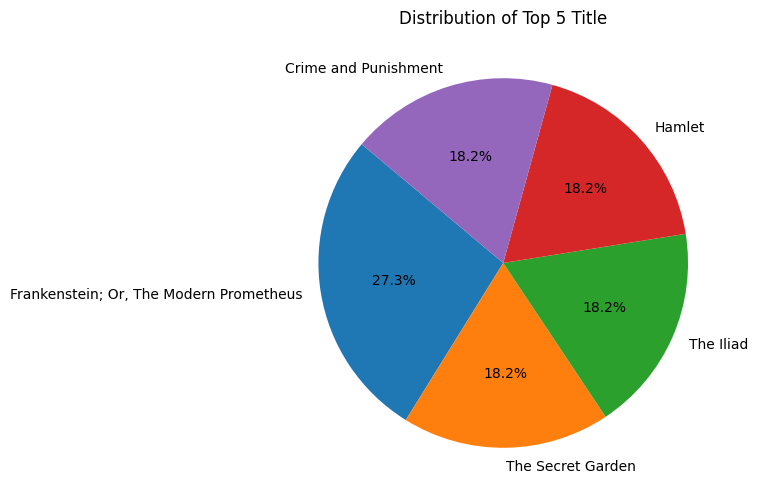

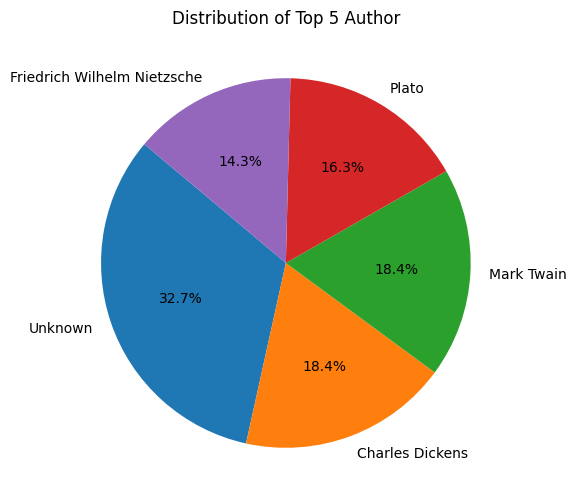

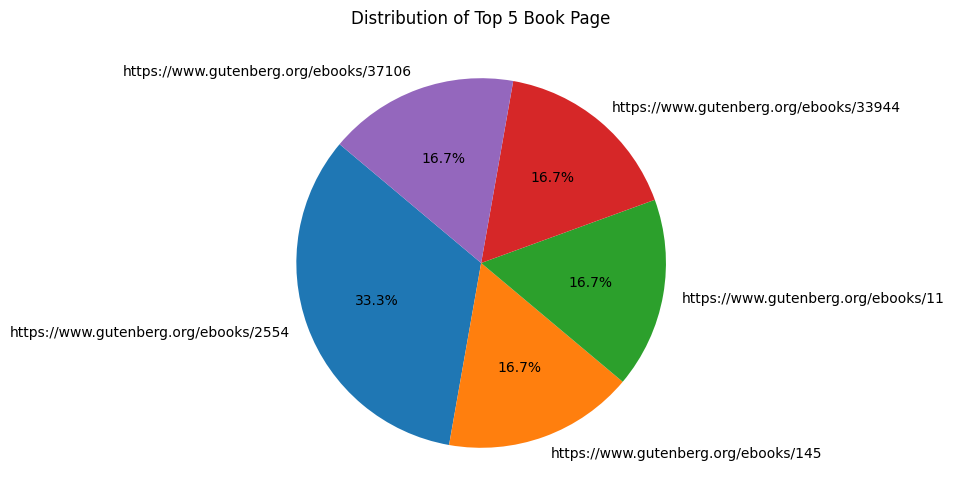

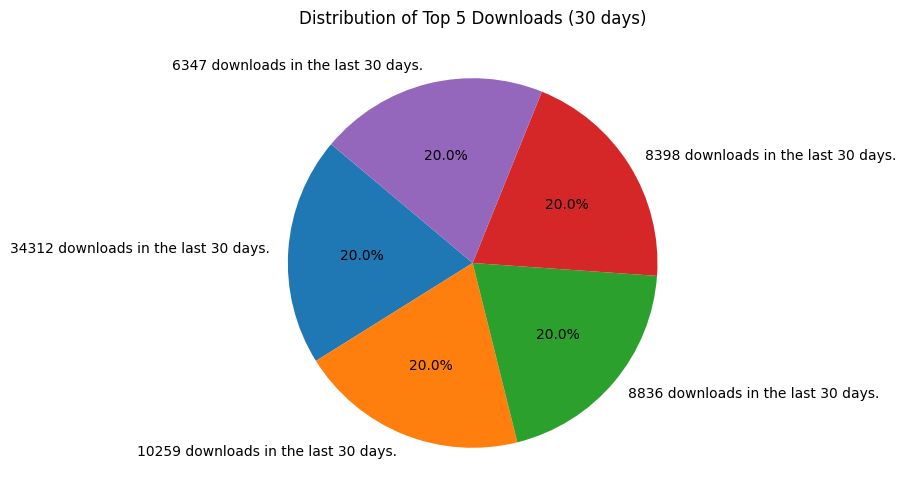

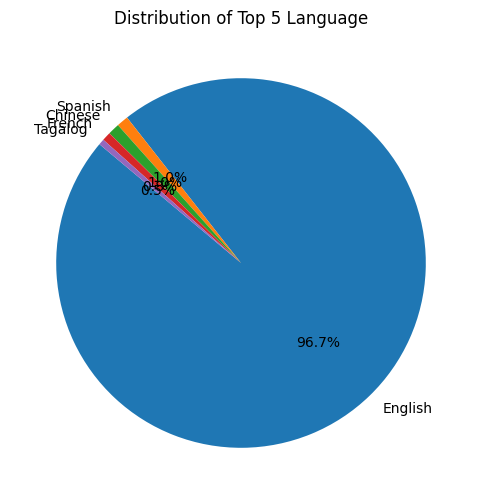

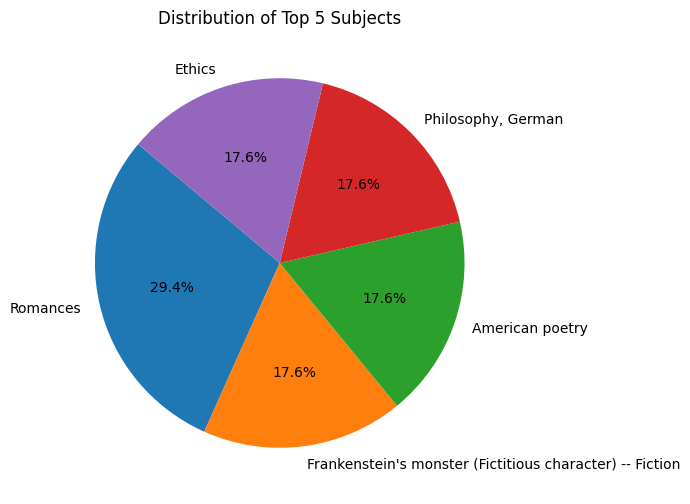

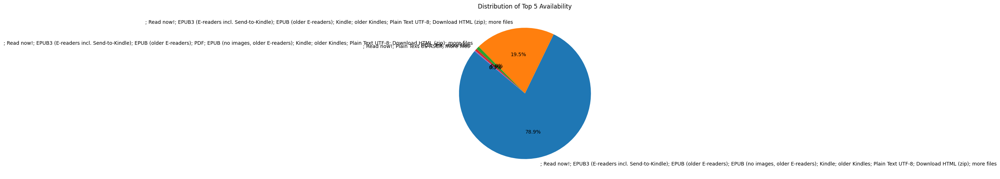

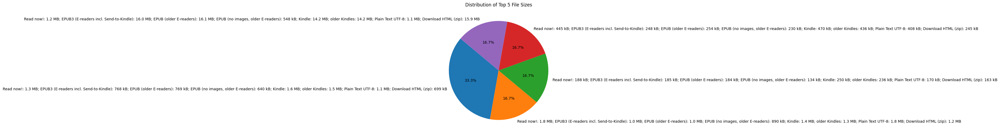

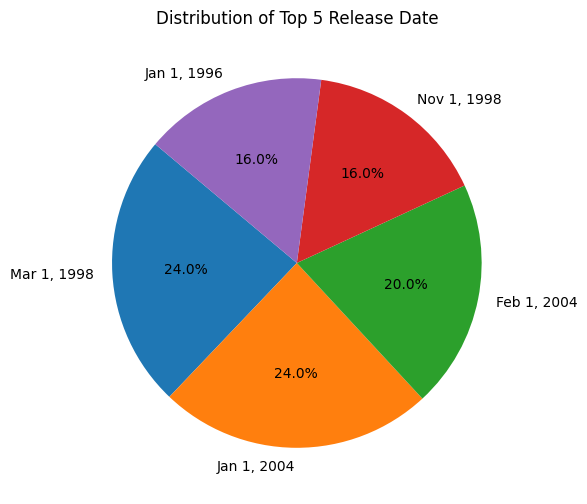

In [37]:
for col in categorical_cols:
    top_values = data[col].value_counts().nlargest(5)  # Top 5 categories
    plt.figure(figsize=(6,6))
    plt.pie(top_values, labels=top_values.index, autopct='%1.1f%%', startangle=140)
    plt.title(f"Distribution of Top 5 {col}")
    plt.show()


### Non visualized analysis for top distribution of top 5 title

In [38]:
import pandas as pd

# Assume data is already loaded
# Identify categorical columns
categorical_cols = data.select_dtypes(include=['object']).columns.tolist()

# Dictionary to store non-visualized analysis
top5_analysis = {}

for col in categorical_cols:
    # Get top 5 categories
    top_values = data[col].value_counts().nlargest(5)
    
    # Compute percentages
    percentages = (top_values / top_values.sum() * 100).round(2)
    
    # Combine into a DataFrame
    top5_df = pd.DataFrame({
        'Category': top_values.index,
        'Count': top_values.values,
        'Percentage': percentages.values
    })
    
    top5_analysis[col] = top5_df
    
    print(f"\nTop 5 categories for column '{col}':")
    print(top5_df)



Top 5 categories for column 'Title':
                                  Category  Count  Percentage
0  Frankenstein; Or, The Modern Prometheus      3       27.27
1                        The Secret Garden      2       18.18
2                                The Iliad      2       18.18
3                                   Hamlet      2       18.18
4                     Crime and Punishment      2       18.18

Top 5 categories for column 'Author':
                      Category  Count  Percentage
0                      Unknown     16       32.65
1              Charles Dickens      9       18.37
2                   Mark Twain      9       18.37
3                        Plato      8       16.33
4  Friedrich Wilhelm Nietzsche      7       14.29

Top 5 categories for column 'Book Page':
                                 Category  Count  Percentage
0   https://www.gutenberg.org/ebooks/2554      2       33.33
1    https://www.gutenberg.org/ebooks/145      1       16.67
2     https://www.gutenber

### countplot for top categories in title

C:\Users\Hp\AppData\Local\Temp\ipykernel_23272\4020190885.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y=col, data=data, order=data[col].value_counts().index[:15], palette='viridis')


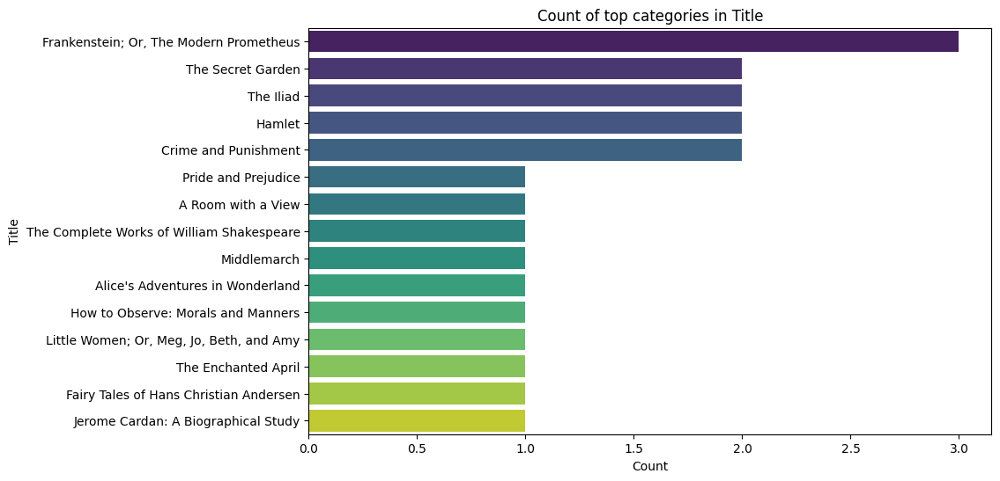

C:\Users\Hp\AppData\Local\Temp\ipykernel_23272\4020190885.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y=col, data=data, order=data[col].value_counts().index[:15], palette='viridis')


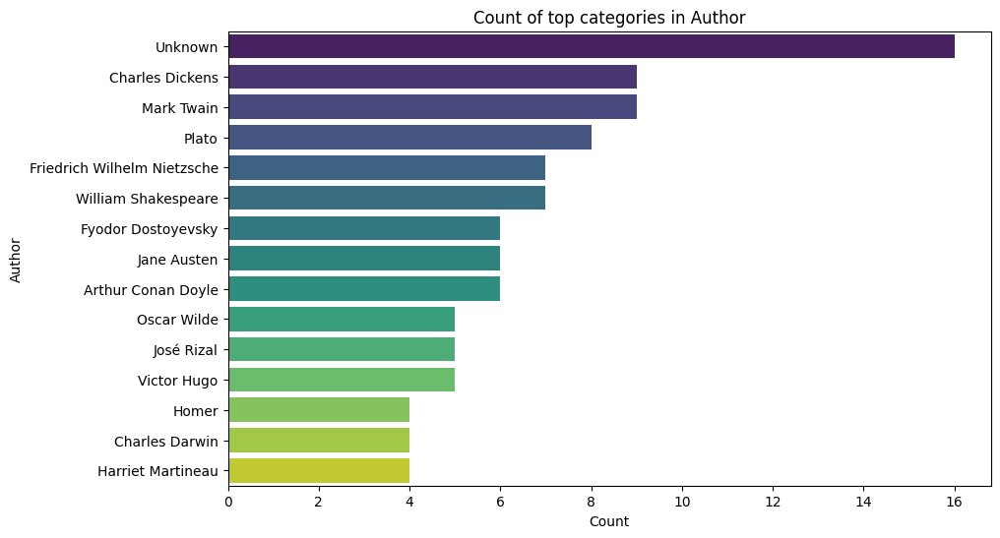

C:\Users\Hp\AppData\Local\Temp\ipykernel_23272\4020190885.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y=col, data=data, order=data[col].value_counts().index[:15], palette='viridis')


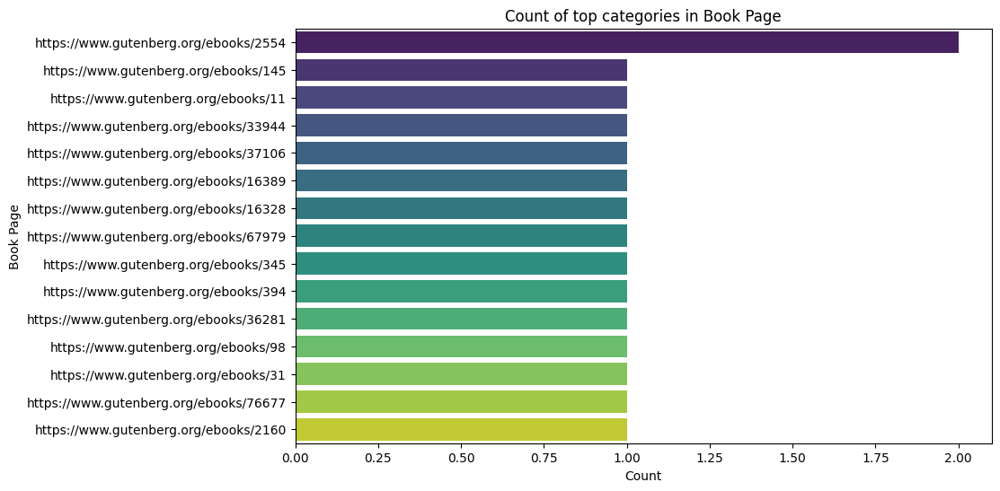

C:\Users\Hp\AppData\Local\Temp\ipykernel_23272\4020190885.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y=col, data=data, order=data[col].value_counts().index[:15], palette='viridis')


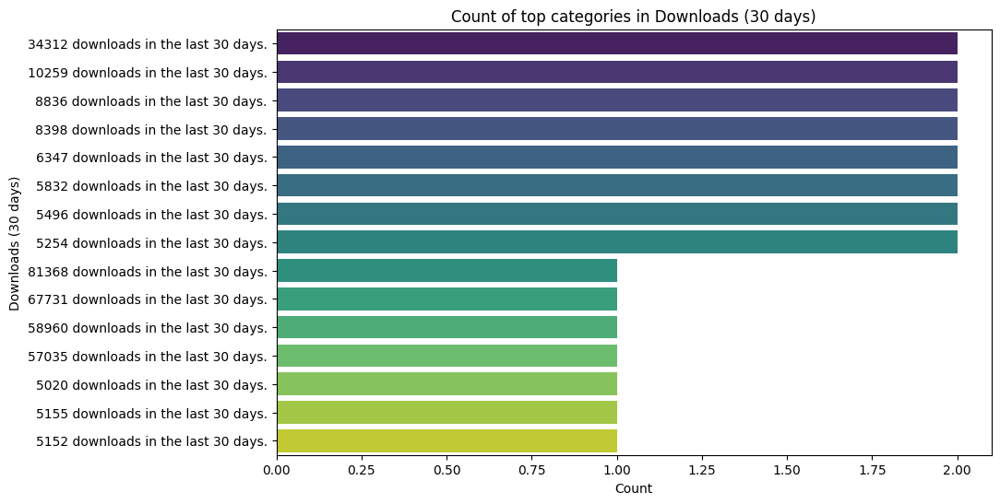

C:\Users\Hp\AppData\Local\Temp\ipykernel_23272\4020190885.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y=col, data=data, order=data[col].value_counts().index[:15], palette='viridis')


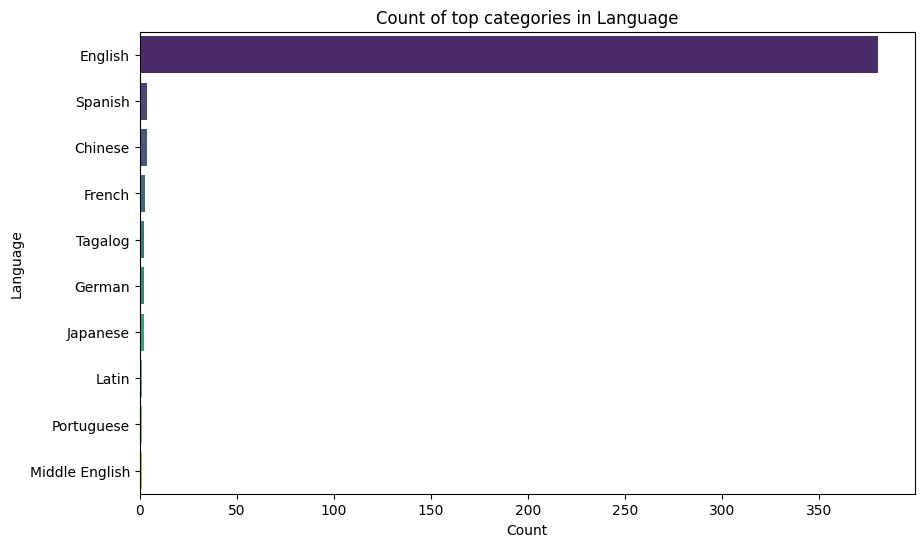

C:\Users\Hp\AppData\Local\Temp\ipykernel_23272\4020190885.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y=col, data=data, order=data[col].value_counts().index[:15], palette='viridis')


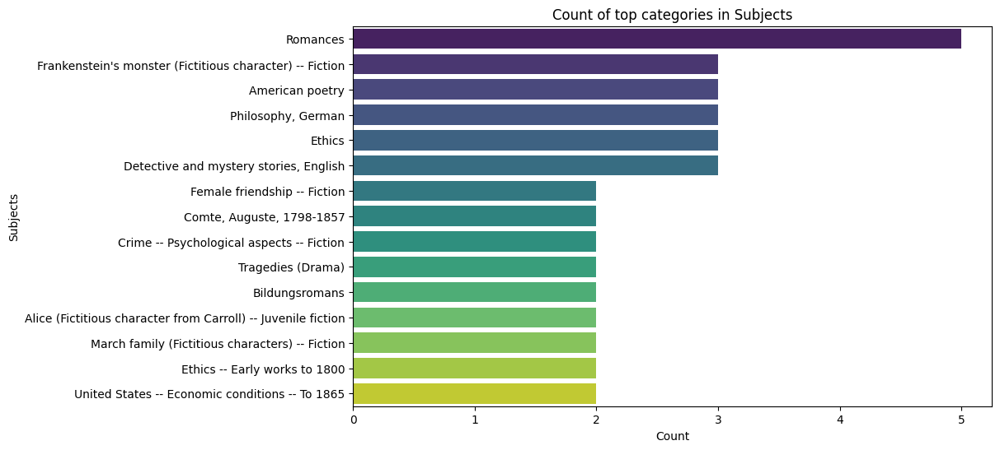

C:\Users\Hp\AppData\Local\Temp\ipykernel_23272\4020190885.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y=col, data=data, order=data[col].value_counts().index[:15], palette='viridis')


C:\Users\Hp\AppData\Local\Temp\ipykernel_23272\4020190885.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y=col, data=data, order=data[col].value_counts().index[:15], palette='viridis')


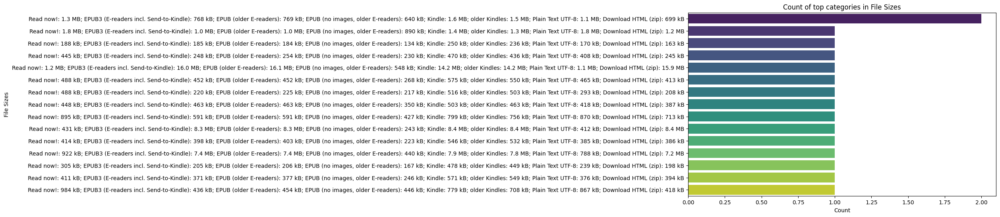

C:\Users\Hp\AppData\Local\Temp\ipykernel_23272\4020190885.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y=col, data=data, order=data[col].value_counts().index[:15], palette='viridis')


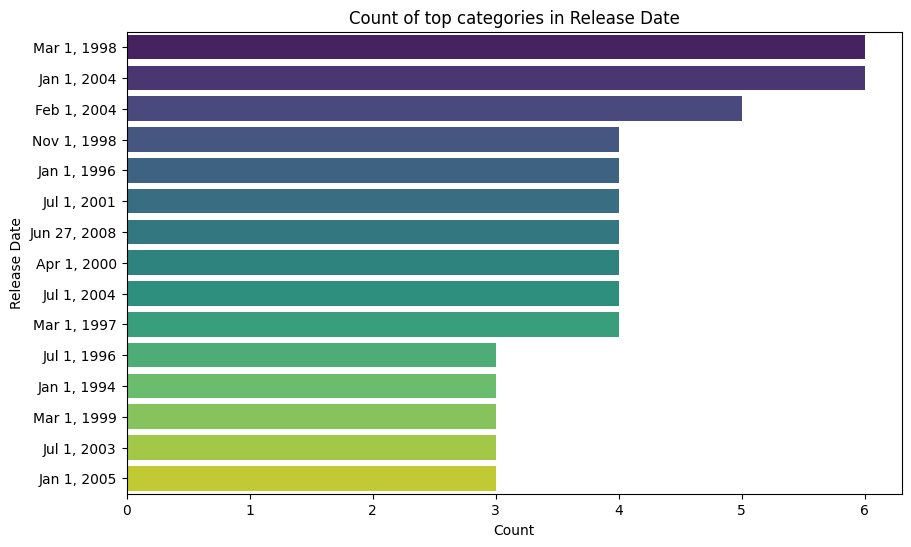

In [39]:
import seaborn as sns
import matplotlib.pyplot as plt

for col in categorical_cols:
    plt.figure(figsize=(10,6))
    sns.countplot(y=col, data=data, order=data[col].value_counts().index[:15], palette='viridis')
    plt.title(f"Count of top categories in {col}")
    plt.xlabel("Count")
    plt.ylabel(col)
    plt.show()


### Non visualization analysis on count of top categories in author

In [40]:
import pandas as pd

# Dictionary to store results
top15_analysis = {}

for col in categorical_cols:
    # Get top 15 categories by count
    top_values = data[col].value_counts().nlargest(15)
    
    # Calculate percentages
    percentages = (top_values / top_values.sum() * 100).round(2)
    
    # Combine into DataFrame
    top15_df = pd.DataFrame({
        "Category": top_values.index,
        "Count": top_values.values,
        "Percentage": percentages.values
    })
    
    top15_analysis[col] = top15_df
    
    print(f"\nTop 15 categories for column '{col}':")
    top15_df



Top 15 categories for column 'Title':

Top 15 categories for column 'Author':

Top 15 categories for column 'Book Page':

Top 15 categories for column 'Downloads (30 days)':

Top 15 categories for column 'Language':

Top 15 categories for column 'Subjects':

Top 15 categories for column 'Availability':

Top 15 categories for column 'File Sizes':

Top 15 categories for column 'Release Date':


## Bivariate analysis

### Numeric columns

### Scatter plot for Book ID vs Downloads 

In [41]:
numeric_cols = data.select_dtypes(include=['int64','float64']).columns

# Example: pairwise scatter plots
for i in range(len(numeric_cols)):
    for j in range(i+1, len(numeric_cols)):
        plt.figure(figsize=(8,5))
        sns.scatterplot(x=numeric_cols[i], y=numeric_cols[j], data=data)
        plt.title(f"{numeric_cols[i]} vs {numeric_cols[j]}")
        plt.show()


### correlation heatmap of numeric columns

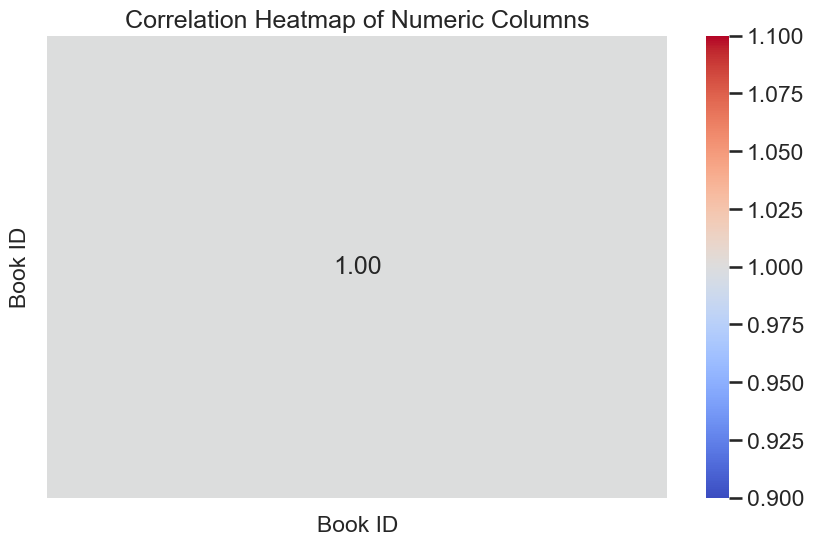

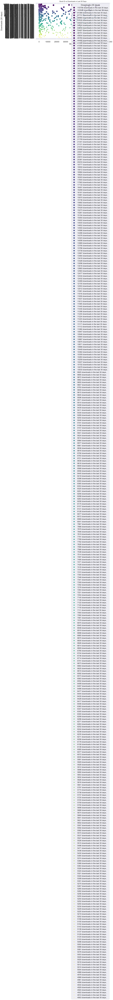

In [51]:
import matplotlib.pyplot as plt
import seaborn as sns

# --- Correlation Heatmap ---
plt.figure(figsize=(10,6))
corr = data[numeric_cols].corr()
sns.heatmap(corr, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Correlation Heatmap of Numeric Columns")
plt.show()

# --- Book_ID vs Downloads in last 30 days ---
plt.figure(figsize=(12,6))
sns.scatterplot(data=data, x="Book ID", y="Downloads (30 days)", hue="Downloads (30 days)", palette="viridis", size="Downloads (30 days)", sizes=(20,200))
plt.title("Book ID vs Downloads in Last 30 Days", fontsize=14)
plt.xlabel("Book ID")
plt.ylabel("Downloads (30 days)")
plt.show()


### Non visualized analysis for corelation heatmap of numeric columns

In [ ]:
import pandas as pd

# Compute correlation matrix for numeric columns
corr_matrix = data[numeric_cols].corr()

# Display the correlation matrix
print("Correlation matrix of numeric columns:")
corr_matrix

# Optional: store it as a CSV for reporting
# corr_matrix.to_csv("numeric_columns_correlation.csv")


### Hexbin plot for Book ID vs Downloadsin last 30 days

In [ ]:
for i in range(len(numeric_cols)):
    for j in range(i+1, len(numeric_cols)):
        plt.figure(figsize=(8,5))
        plt.hexbin(data[numeric_cols[i]], data[numeric_cols[j]], gridsize=25, cmap='Blues')
        plt.colorbar(label='Count')
        plt.xlabel(numeric_cols[i])
        plt.ylabel(numeric_cols[j])
        plt.title(f"Hexbin: {numeric_cols[i]} vs {numeric_cols[j]}")
        plt.show()


### Categorical columns

###  stacked bar chart for author vs language

In [ ]:
ct = pd.crosstab(data['Author'], data['Language'])
ct.iloc[:10].plot(kind='bar', stacked=True, figsize=(12,6), colormap='tab20')
plt.title("Stacked Bar Chart: Author vs Language")
plt.xlabel("Author")
plt.ylabel("Count")
plt.legend(title="Language")
plt.show()


In [ ]:
import pandas as pd

# Crosstab of Author vs Language
ct = pd.crosstab(data['Author'], data['Language'])

# Optional: limit to first 10 authors (as in your plot)
ct_top10 = ct.iloc[:10]

print("Crosstab: Author vs Language (first 10 authors)")
print(ct_top10)

# Optional: calculate percentages per row
ct_percent = ct_top10.div(ct_top10.sum(axis=1), axis=0) * 100
ct_percent = ct_percent.round(2)

print("\nPercentage distribution per Author (first 10 authors):")
ct_percent


### Bubble plot for language vs author

In [ ]:
ct = data.groupby(["Language","Author"]).size().reset_index(name="count")

plt.figure(figsize=(10,6))
sns.scatterplot(data=ct, x="Language", y="Author", size="count", sizes=(50, 500), alpha=0.6)
plt.title("Bubble Plot: Language vs Author")
plt.xticks(rotation=45)
plt.show()


### Non visualized analysis for bubble plot of language vs author

In [ ]:
import pandas as pd

# Group by Language and Author, and count occurrences
ct = data.groupby(["Language", "Author"]).size().reset_index(name="count")

print("Language vs Author counts (bubble plot data):")
print(ct)

# Optional: sort by count descending for easier analysis
ct_sorted = ct.sort_values(by="count", ascending=False).reset_index(drop=True)
print("\nSorted by count descending:")
ct_sorted.head(20)  # show top 20 rows


### Heatmap for language vs author

In [ ]:
ct = pd.crosstab(data['Language'], data['Author'])
plt.figure(figsize=(12,6))
sns.heatmap(ct.iloc[:10, :10], cmap="YlGnBu", annot=False, cbar=True)
plt.title("Heatmap of Language vs Author (Top 10)")
plt.show()


### Non visualization analysis for heatmap of language vs author

In [ ]:
import pandas as pd

# Create crosstab of Language vs Author
ct = pd.crosstab(data['Language'], data['Author'])

# Keep top 10 languages and top 10 authors by total count
top10_languages = ct.sum(axis=1).nlargest(10).index
top10_authors = ct.sum(axis=0).nlargest(10).index

ct_top10 = ct.loc[top10_languages, top10_authors]

print("Crosstab table: Language vs Author (Top 10 Languages & Top 10 Authors)")
print(ct_top10)

# Optional: calculate row-wise percentages
ct_percent = ct_top10.div(ct_top10.sum(axis=1), axis=0) * 100
ct_percent = ct_percent.round(2)

print("\nPercentage distribution per Language (Top 10 Languages & Top 10 Authors):")
ct_percent


## Multivariate analysis

### Numerical column

### Pairplot for numerical columns

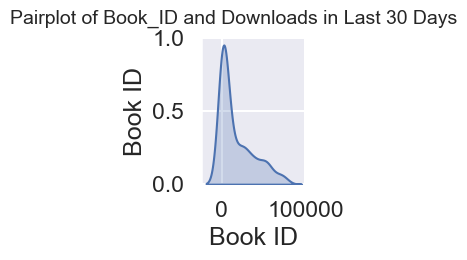

In [53]:
import seaborn as sns
import matplotlib.pyplot as plt

# Select only the columns you want for pairplot
cols_to_plot = ["Book ID", "Downloads (30 days)"]

# Pairplot for multivariate analysis
sns.pairplot(data[cols_to_plot], diag_kind="kde", plot_kws={'alpha':0.6})
plt.suptitle("Pairplot of Book_ID and Downloads in Last 30 Days", y=1.02, fontsize=14)
plt.show()


### Non visualization analysis for pairplot of numerical columns

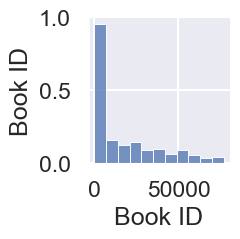

In [60]:
sns.pairplot(data)

In [44]:
import pandas as pd
import numpy as np

# Select numeric columns
numeric_cols = data.select_dtypes(include=['int64','float64']).columns
num_df = data[numeric_cols]

# 1. Descriptive statistics (mean, std, min, max, quartiles)
desc_stats = num_df.describe().T  # transpose for readability
print("Descriptive statistics of numerical columns:")
print(desc_stats)

# 2. Correlation matrix
corr_matrix = num_df.corr()
print("\nCorrelation matrix of numerical columns:")
print(corr_matrix)

# 3. Optional: Covariance matrix
cov_matrix = num_df.cov()
print("\nCovariance matrix of numerical columns:")
cov_matrix

Descriptive statistics of numerical columns:
         count        mean           std   min     25%     50%       75%      max
Book ID  400.0  17024.5725  20474.964294  10.0  1258.5  6084.0  28455.75  76806.0

Correlation matrix of numerical columns:
         Book ID
Book ID      1.0

Covariance matrix of numerical columns:


,Book ID
Book ID,4.192242e+08


### Corelation heatmap for numerical column

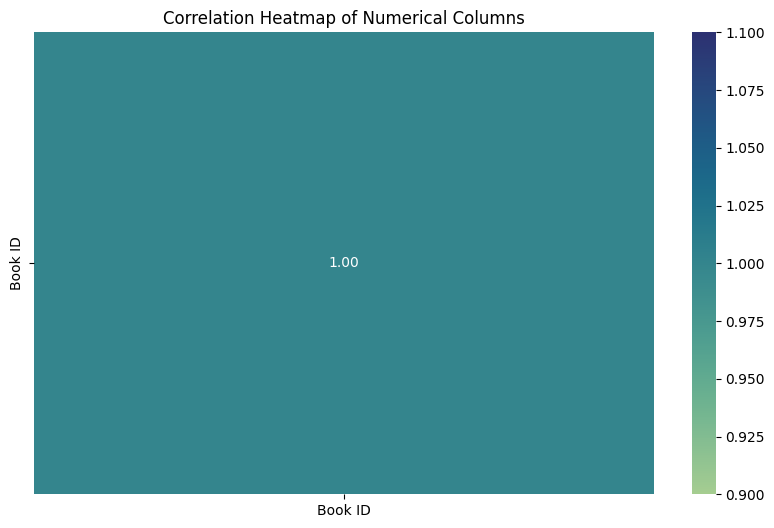

In [45]:
plt.figure(figsize=(10,6))
corr = data[numeric_cols].corr()
sns.heatmap(corr, annot=True, cmap="crest", fmt=".2f")
plt.title("Correlation Heatmap of Numerical Columns")
plt.show()


### Non visualization analysis for corelation heatmap of numerical columns

In [46]:
import pandas as pd

# Select numeric columns
numeric_cols = data.select_dtypes(include=['int64','float64']).columns
num_df = data[numeric_cols]

# Compute correlation matrix
corr_matrix = num_df.corr()

# Display the correlation matrix
print("Correlation matrix of numerical columns:")
corr_matrix


Correlation matrix of numerical columns:


,Book ID
Book ID,1.0


### cluster map for title vs author

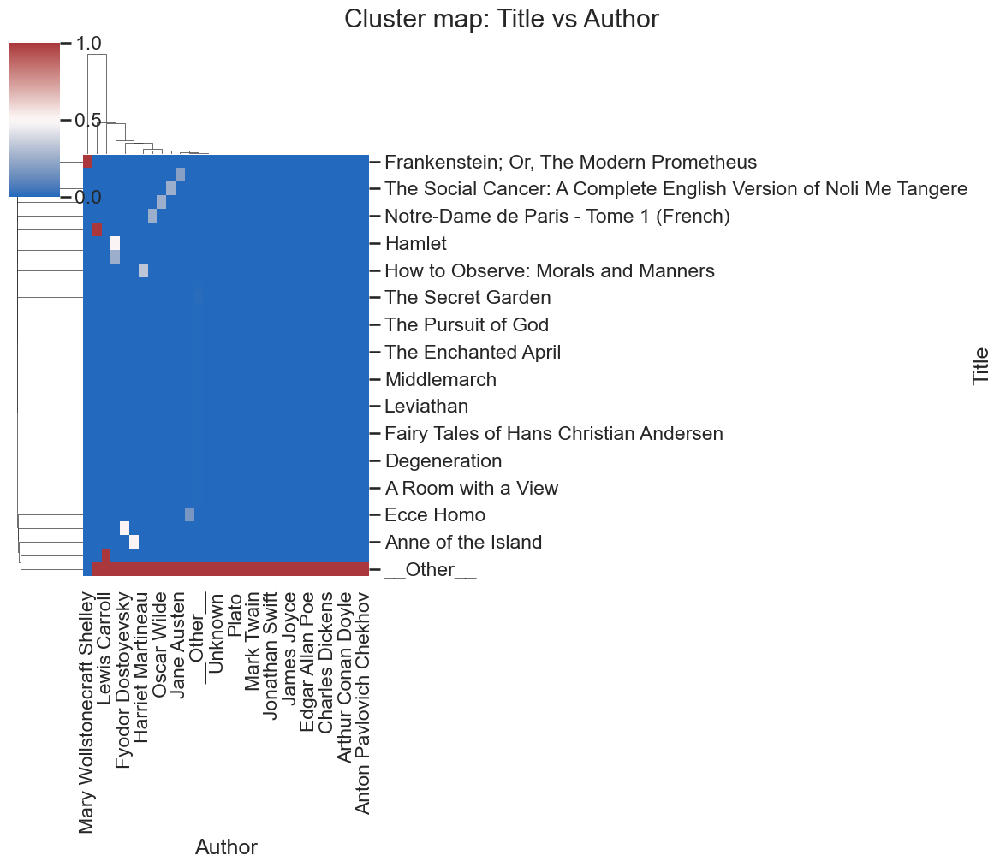

In [47]:
import pandas as pd, numpy as np
import matplotlib.pyplot as plt, seaborn as sns

path = r'Favorites/Links/gutenberg_400_books.csv'
df = pd.read_csv(path, low_memory=False)
cats = df.select_dtypes(include=['object','category']).columns.tolist()
# pick two columns (auto pick first two if you don't set them)
col_x, col_y = (cats[0], cats[1]) if len(cats) >= 2 else (cats[0], None)
assert col_y is not None, "Need at least two categorical columns."

# reduce to top-k values to avoid giant matrices
top_k = 30
df2 = df[[col_x, col_y]].dropna().copy()
df2[col_x] = df2[col_x].where(df2[col_x].isin(df2[col_x].value_counts().nlargest(top_k).index), '__Other__')
df2[col_y] = df2[col_y].where(df2[col_y].isin(df2[col_y].value_counts().nlargest(top_k).index), '__Other__')

ct = pd.crosstab(df2[col_x], df2[col_y])

# cluster map (rows/cols clustered)
sns.set(context="talk")
g = sns.clustermap(ct, metric='correlation', cmap='vlag', standard_scale=1, figsize=(12,10))
plt.suptitle(f"Cluster map: {col_x} vs {col_y}", y=1.02)
plt.show()


### Normalised stacked bar plot for language vs author

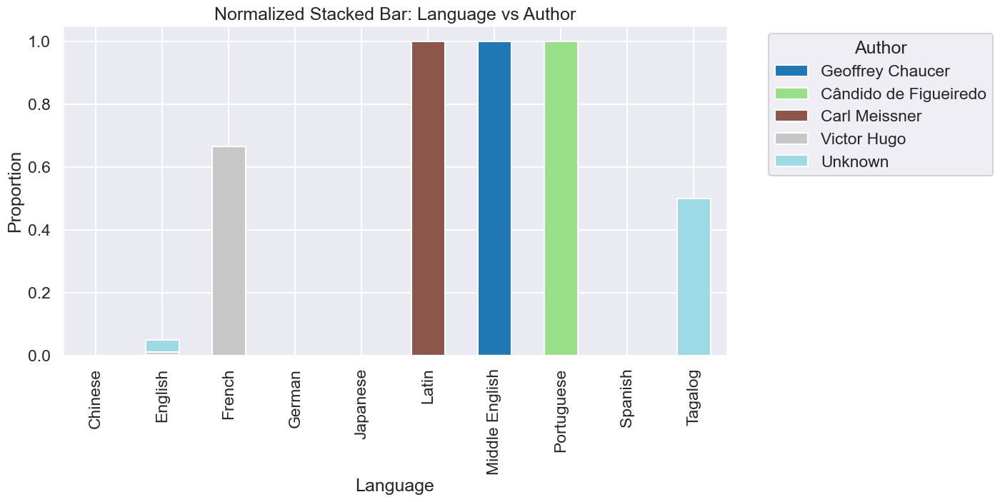

In [48]:
import pandas as pd, matplotlib.pyplot as plt

df = pd.read_csv(r'Favorites/Links/gutenberg_400_books.csv')

col_a, col_b = "Language", "Author"   # change to your columns

ct = pd.crosstab(df[col_a], df[col_b], normalize="index")
ct = ct[ct.sum(axis=0).sort_values(ascending=False).head(5).index]  # top 5 categories

ct.plot(kind="bar", stacked=True, figsize=(12,6), colormap="tab20")
plt.title(f"Normalized Stacked Bar: {col_a} vs {col_b}")
plt.ylabel("Proportion")
plt.legend(title=col_b, bbox_to_anchor=(1.05,1))
plt.show()


### Non visualization analysis on normalized stacked bar language vs author

In [49]:
import pandas as pd

# Load dataset
df = pd.read_csv(r'Favorites/Links/gutenberg_400_books.csv')

col_a, col_b = "Language", "Author"   # categorical columns

# Crosstab with row-wise normalization (proportions)
ct = pd.crosstab(df[col_a], df[col_b], normalize="index")

# Keep top 5 authors by total proportion
top5_authors = ct.sum(axis=0).sort_values(ascending=False).head(5).index
ct_top5 = ct[top5_authors]

# Round proportions to 2 decimals
ct_top5 = ct_top5.round(2)

print(f"Normalized proportion table: {col_a} vs top 5 {col_b}")
ct_top5


Normalized proportion table: Language vs top 5 Author


Author,Geoffrey Chaucer,Cândido de Figueiredo,Carl Meissner,Victor Hugo,Unknown
Language,,,,,
Chinese,0.0,0.0,0.0,0.00,0.00
English,0.0,0.0,0.0,0.01,0.04
French,0.0,0.0,0.0,0.67,0.00
German,0.0,0.0,0.0,0.00,0.00
Japanese,0.0,0.0,0.0,0.00,0.00
Latin,0.0,0.0,1.0,0.00,0.00
Middle English,1.0,0.0,0.0,0.00,0.00
Portuguese,0.0,1.0,0.0,0.00,0.00
Spanish,0.0,0.0,0.0,0.00,0.00


### Univariate analysis for numerical vs numerical columns 

#### Numerical columns

In [48]:
num_cols = final_df.select_dtypes(include=['int64', 'float64']).columns.tolist()
print("Numerical columns:", num_cols)

Numerical columns: ['Book ID', 'Downloads (30 days)', 'Read now! (KB)', 'EPUB3 (E-readers incl. Send-to-Kindle) (KB)', 'EPUB (older E-readers) (KB)', 'EPUB (no images, older E-readers) (KB)', 'Kindle (KB)', 'older Kindles (KB)', 'Plain Text UTF-8 (KB)', 'Download HTML (zip) (KB)']


### Histogram and KDE plot for Book ID

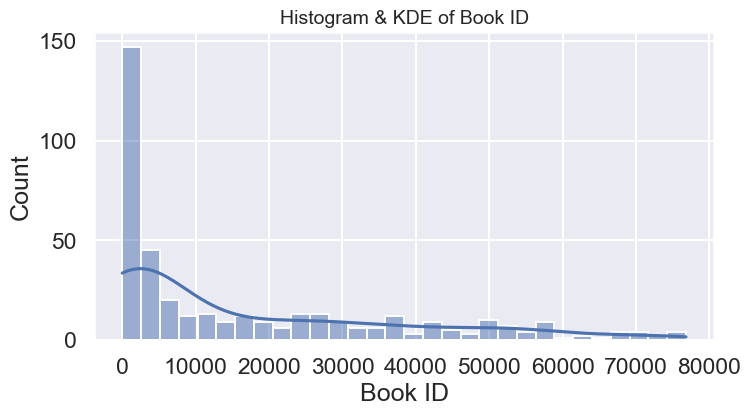

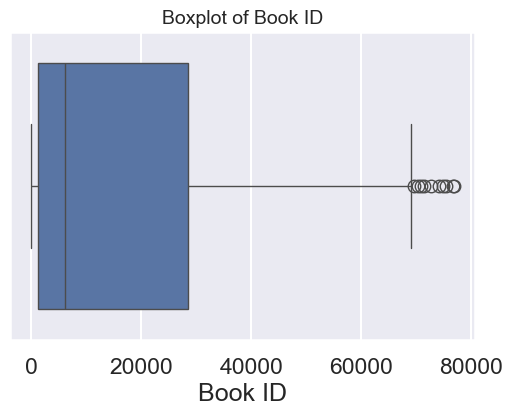

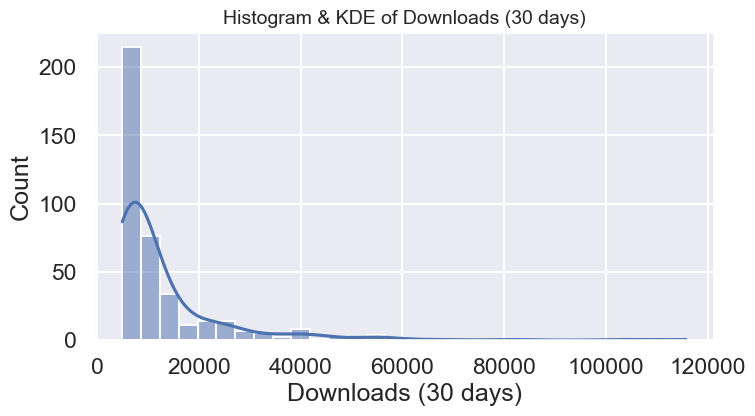

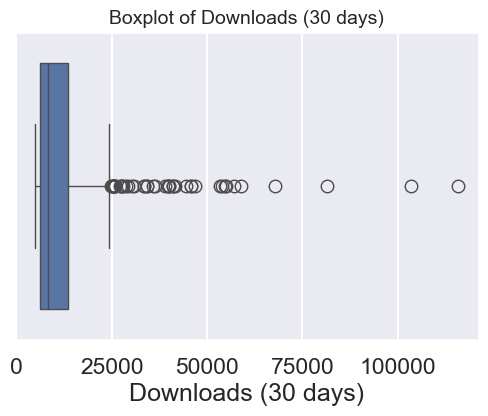

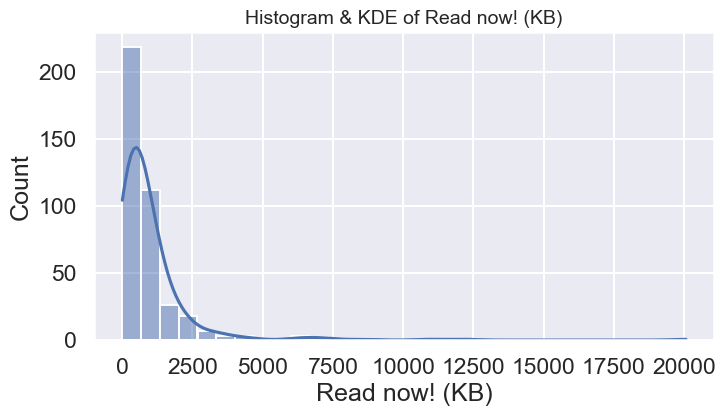

...

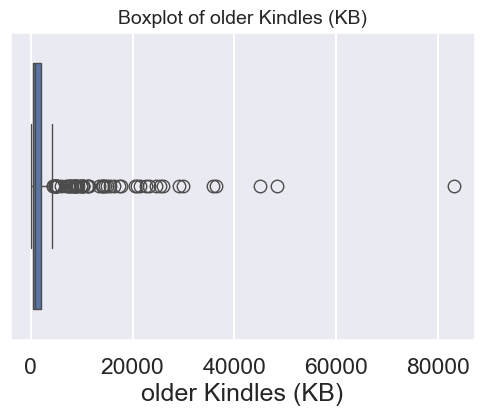

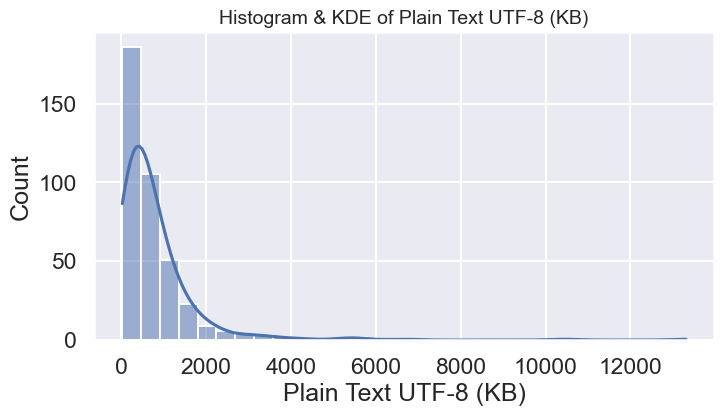

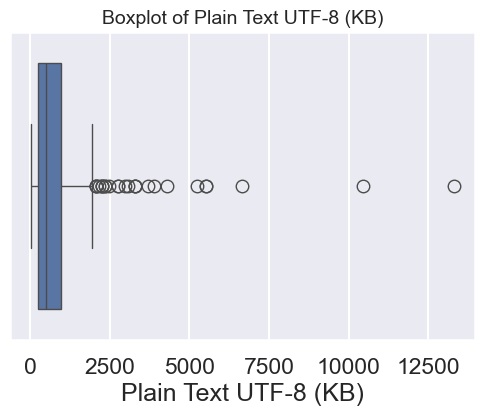

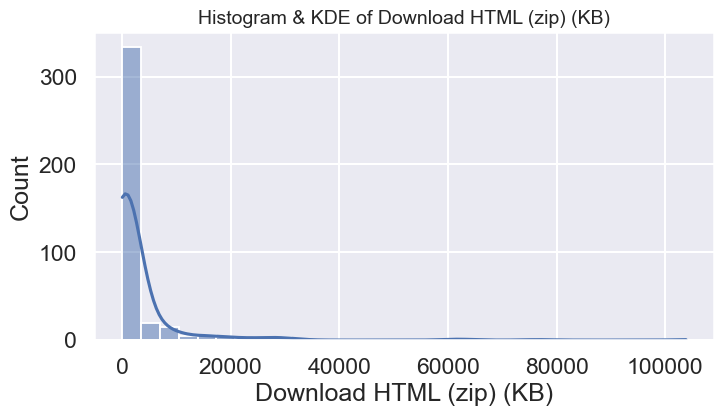

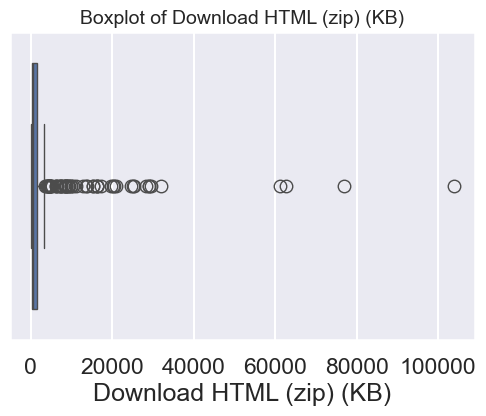

In [49]:
for col in num_cols:
    plt.figure(figsize=(8,4))
    sns.histplot(final_df[col].dropna(), kde=True, bins=30)
    plt.title(f"Histogram & KDE of {col}", fontsize=14)
    plt.xlabel(col)
    plt.ylabel("Count")
    plt.show()

    plt.figure(figsize=(6,4))
    sns.boxplot(x=final_df[col])
    plt.title(f"Boxplot of {col}", fontsize=14)
    plt.show()


### Non visualization analysis on histogram and kde book id

In [121]:
import pandas as pd
import numpy as np
from scipy.stats import gaussian_kde

# Assume num_cols contains your numeric columns
non_viz_analysis = {}

for col in num_cols:
    series = final_df[col].dropna()
    
    # 1. Descriptive statistics (boxplot info)
    q1 = series.quantile(0.25)
    q3 = series.quantile(0.75)
    iqr = q3 - q1
    summary = {
        "count": series.count(),
        "mean": series.mean(),
        "std": series.std(),
        "min": series.min(),
        "Q1": q1,
        "median": series.median(),
        "Q3": q3,
        "max": series.max(),
        "IQR": iqr,
        "lower_bound": q1 - 1.5*iqr,
        "upper_bound": q3 + 1.5*iqr,
        "outliers": series[(series < q1 - 1.5*iqr) | (series > q3 + 1.5*iqr)].tolist()
    }
    
    # 2. Histogram counts
    counts, bin_edges = np.histogram(series, bins=30)
    hist_df = pd.DataFrame({
        "bin_start": bin_edges[:-1],
        "bin_end": bin_edges[1:],
        "count": counts
    })
    
    # 3. KDE values (optional)
    kde = gaussian_kde(series)
    x_grid = np.linspace(series.min(), series.max(), 100)
    kde_values = kde(x_grid)
    kde_df = pd.DataFrame({
        "value": x_grid,
        "density": kde_values
    })
    
    non_viz_analysis[col] = {
        "summary": summary,
        "histogram": hist_df,
        "kde": kde_df
    }

# Example: show summary for first numeric column
first_col = num_cols[0]
print(f"Descriptive summary for {first_col}:")
print(non_viz_analysis[first_col]["summary"])
print("\nHistogram data:")
print(non_viz_analysis[first_col]["histogram"].head())
print("\nKDE data:")
non_viz_analysis[first_col]["kde"].head()


Descriptive summary for Book ID:
{'count': np.int64(400), 'mean': np.float64(17024.5725), 'std': np.float64(20474.96429366388), 'min': np.int64(10), 'Q1': np.float64(1258.5), 'median': np.float64(6084.0), 'Q3': np.float64(28455.75), 'max': np.int64(76806), 'IQR': np.float64(27197.25), 'lower_bound': np.float64(-39537.375), 'upper_bound': np.float64(69251.625), 'outliers': [72679, 76806, 71324, 69566, 70200, 74039, 75293, 74869, 70891, 76677]}

Histogram data:
      bin_start       bin_end  count
0     10.000000   2569.866667    147
1   2569.866667   5129.733333     45
2   5129.733333   7689.600000     20
3   7689.600000  10249.466667     12
4  10249.466667  12809.333333     13

KDE data:


,value,density
0,10.000000,0.000033
1,785.717172,0.000034
2,1561.434343,0.000035
3,2337.151515,0.000035
4,3112.868687,0.000035


### Corelation heatmap for numerical columns

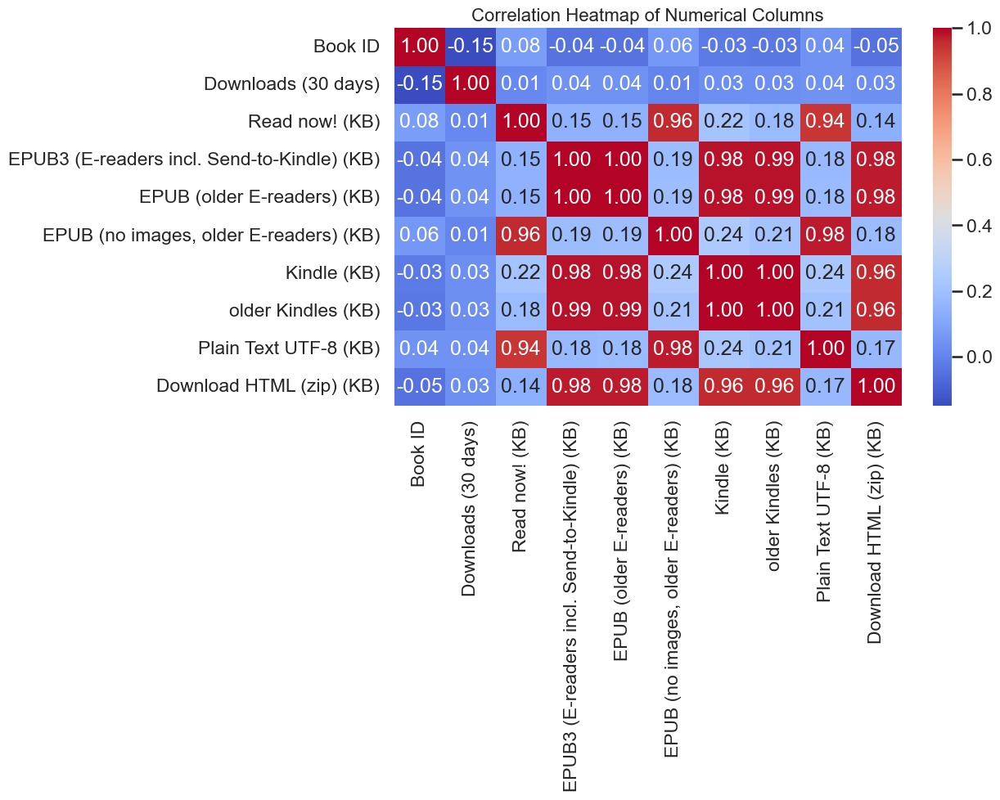

In [50]:
plt.figure(figsize=(10,6))
corr = final_df[num_cols].corr()
sns.heatmap(corr, annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Correlation Heatmap of Numerical Columns", fontsize=16)
plt.show()

### Univariate analysis for numerical vs categorical columns 

### Finding the columns 

In [51]:
num_cols = final_df.select_dtypes(include=['int64', 'float64']).columns.tolist()
cat_cols = final_df.select_dtypes(include=['object']).columns.tolist()

print("Numerical Columns:", num_cols)
print("Categorical Columns:", cat_cols)


Numerical Columns: ['Book ID', 'Downloads (30 days)', 'Read now! (KB)', 'EPUB3 (E-readers incl. Send-to-Kindle) (KB)', 'EPUB (older E-readers) (KB)', 'EPUB (no images, older E-readers) (KB)', 'Kindle (KB)', 'older Kindles (KB)', 'Plain Text UTF-8 (KB)', 'Download HTML (zip) (KB)']
Categorical Columns: ['Title', 'Author', 'Book Page', 'Language', 'Release Date']


### Univariate analysis for numerical vs categorical columns

Numerical Columns: ['Book ID', 'Downloads (30 days)', 'Read now! (KB)', 'EPUB3 (E-readers incl. Send-to-Kindle) (KB)', 'EPUB (older E-readers) (KB)', 'EPUB (no images, older E-readers) (KB)', 'Kindle (KB)', 'older Kindles (KB)', 'Plain Text UTF-8 (KB)', 'Download HTML (zip) (KB)']
Categorical Columns: ['Title', 'Author', 'Book Page', 'Language', 'Release Date']
Selected categorical columns for analysis: ['Language']


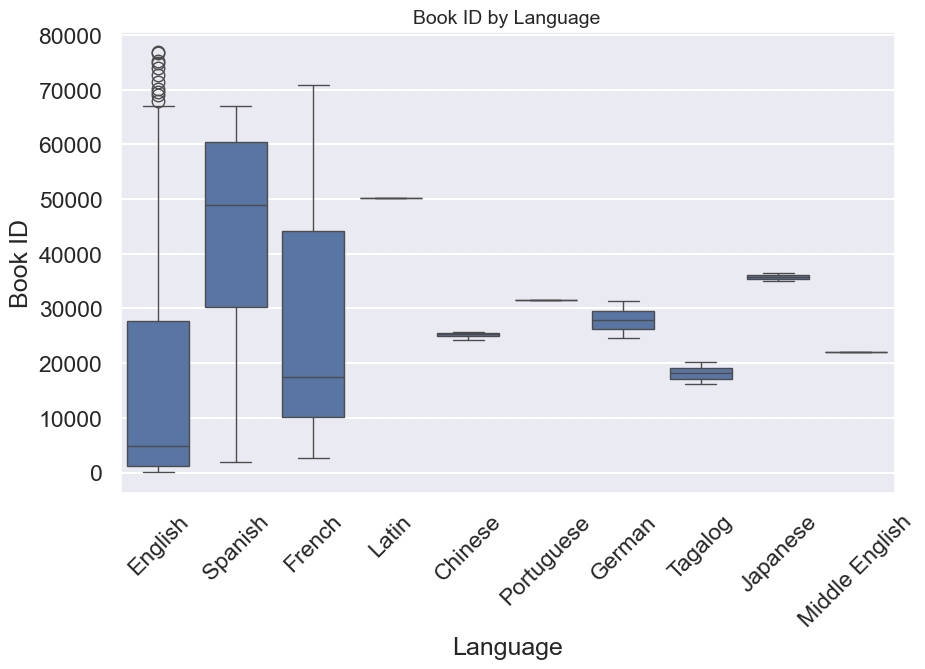

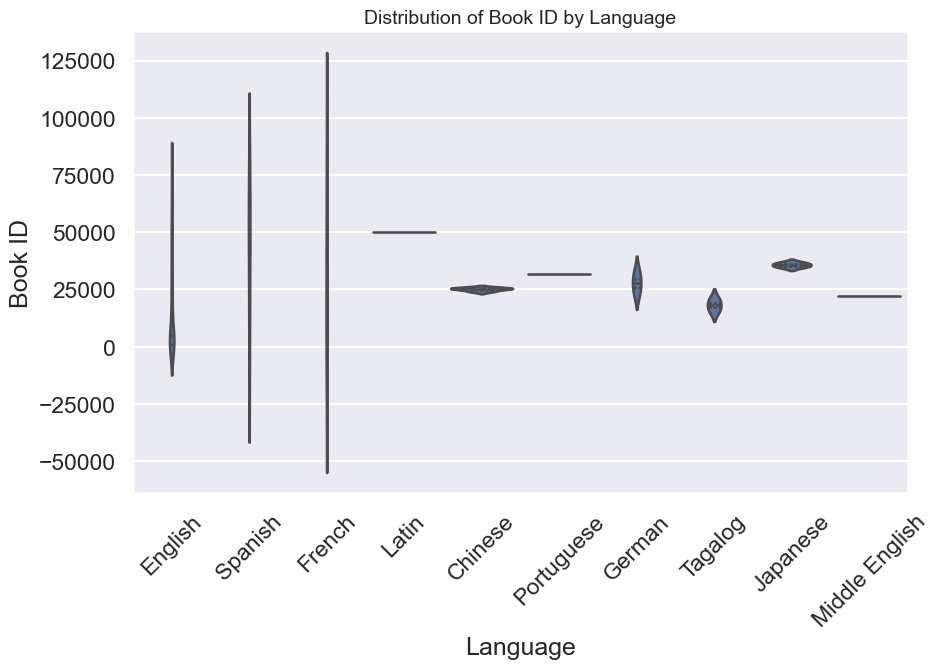

C:\Users\Hp\AppData\Local\Temp\ipykernel_17928\4260186120.py:32: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x=cat, y=num, data=final_df, estimator="mean", ci=None)


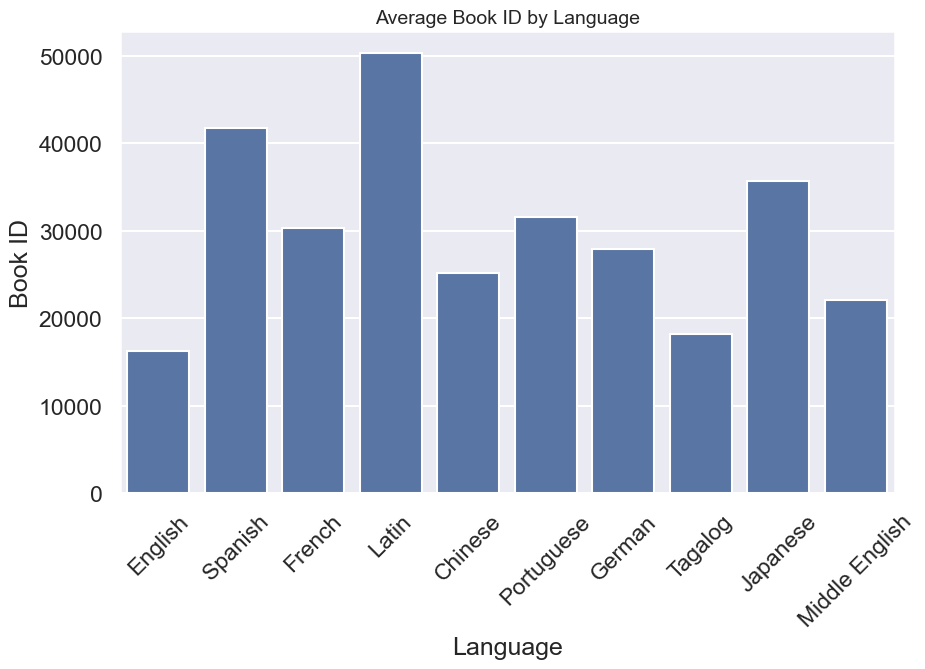

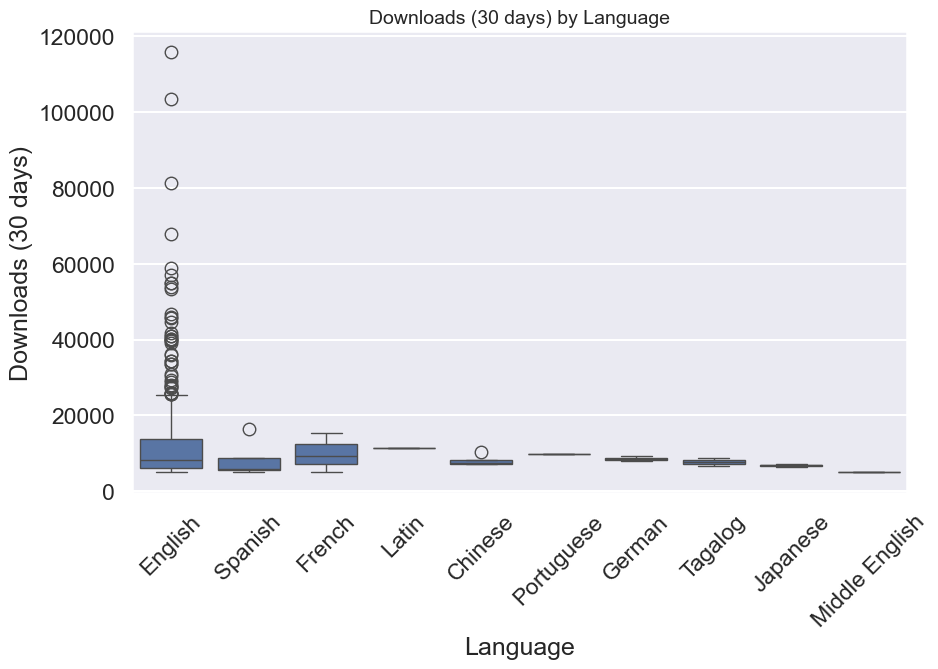

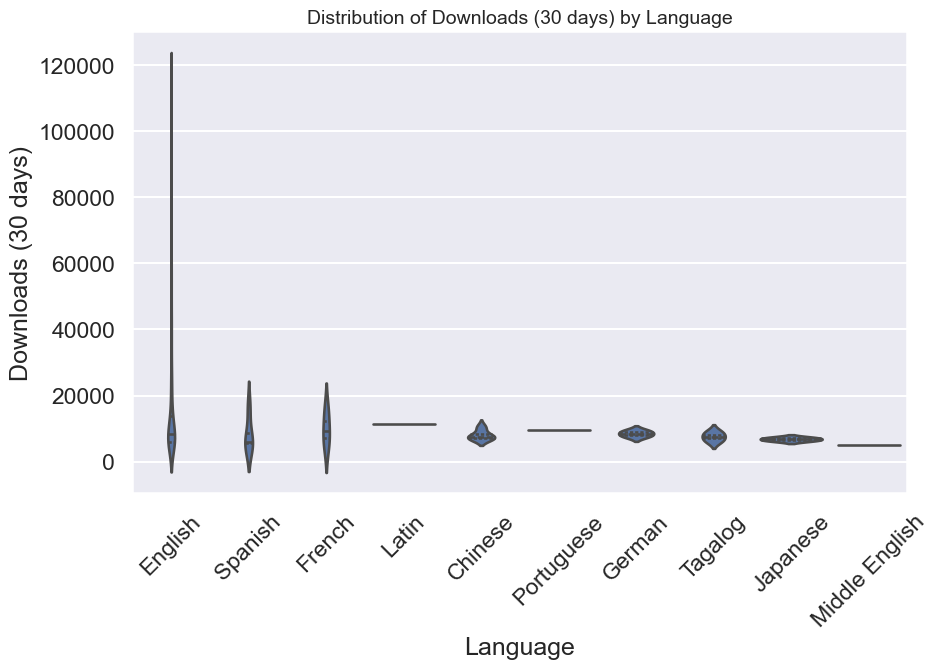

C:\Users\Hp\AppData\Local\Temp\ipykernel_17928\4260186120.py:32: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x=cat, y=num, data=final_df, estimator="mean", ci=None)


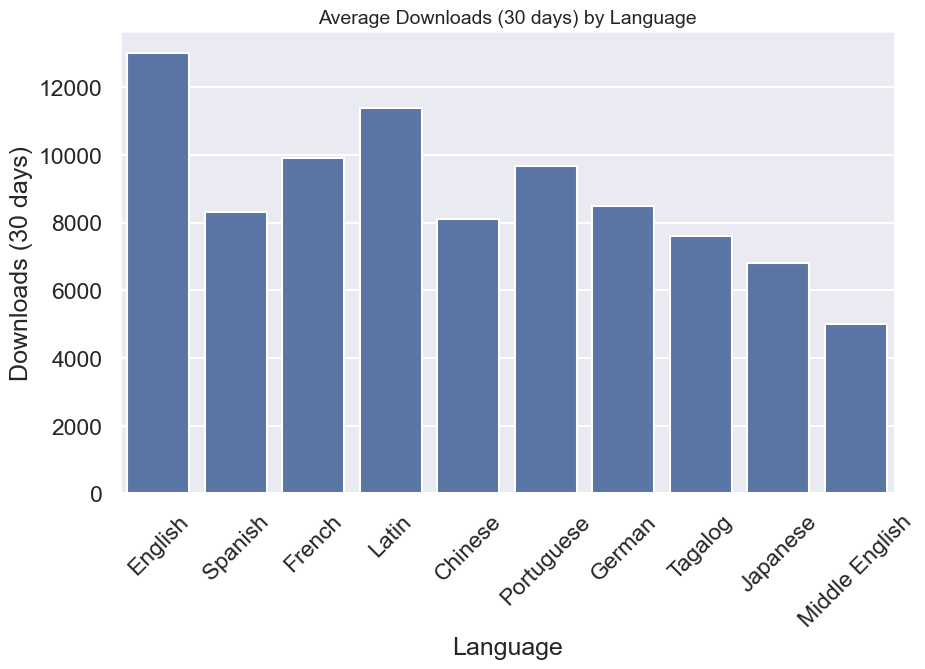

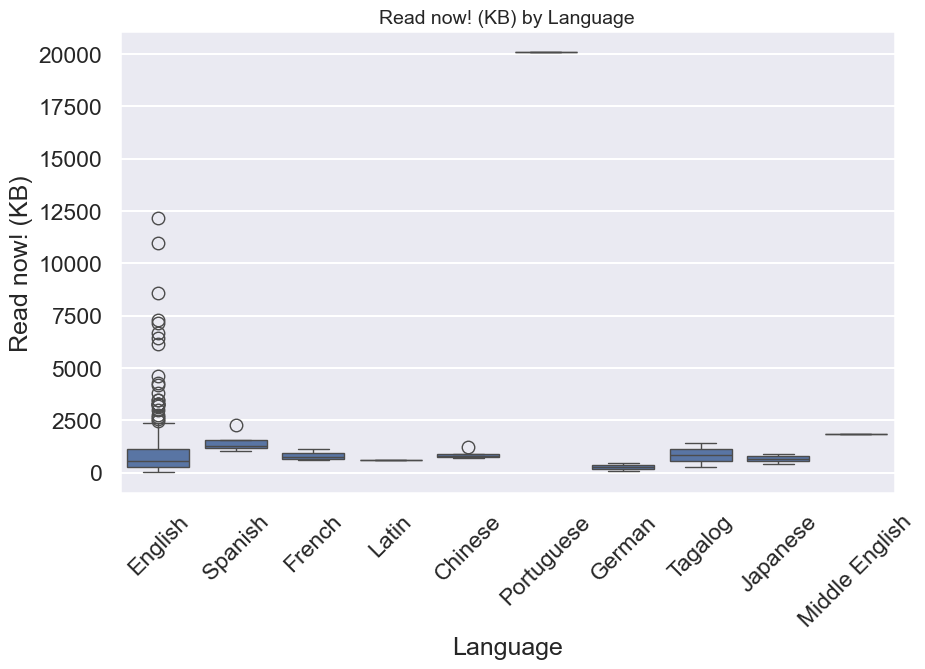

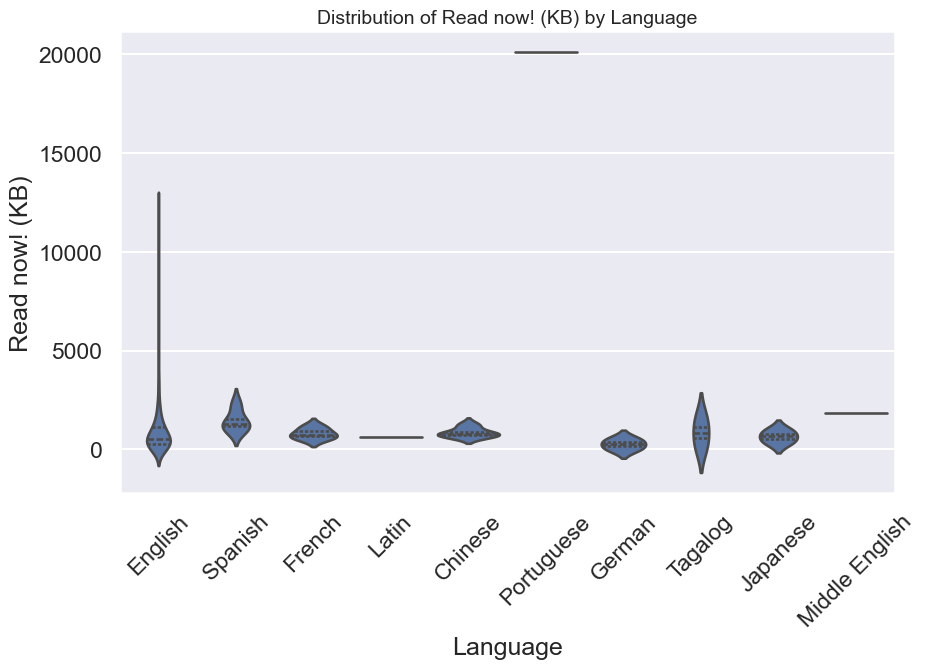

C:\Users\Hp\AppData\Local\Temp\ipykernel_17928\4260186120.py:32: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x=cat, y=num, data=final_df, estimator="mean", ci=None)


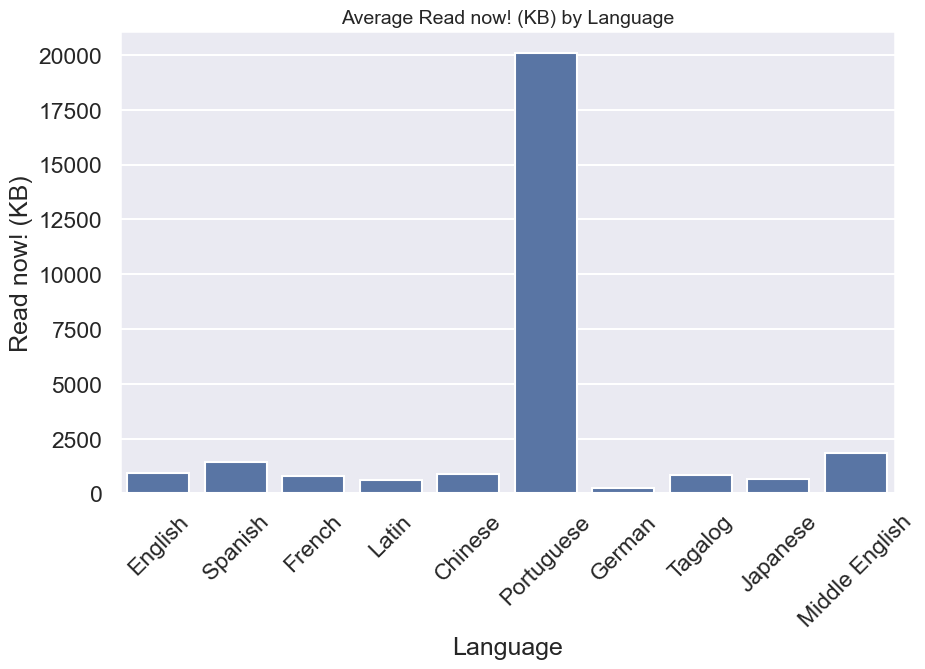

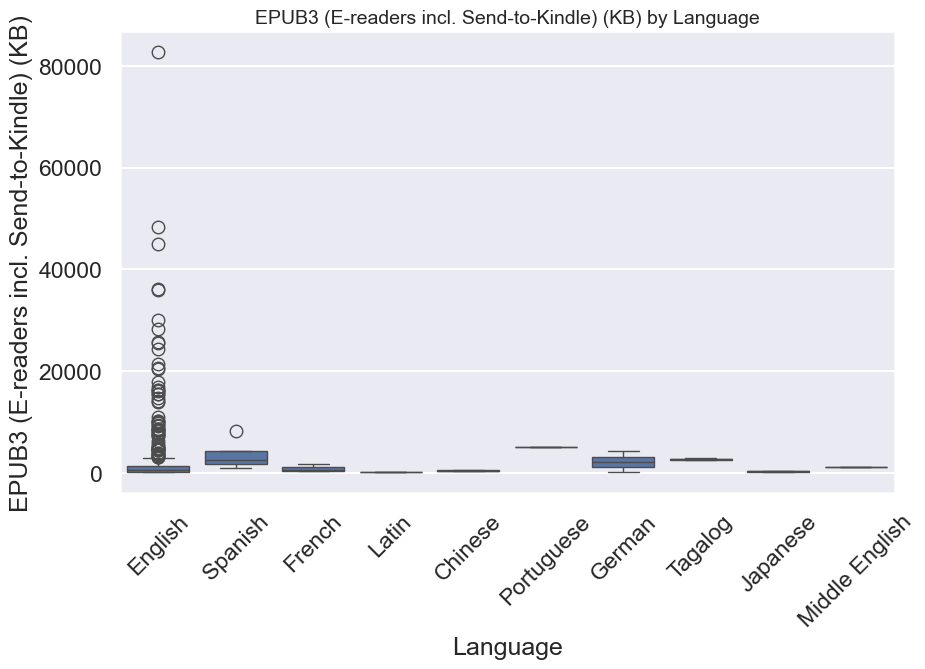

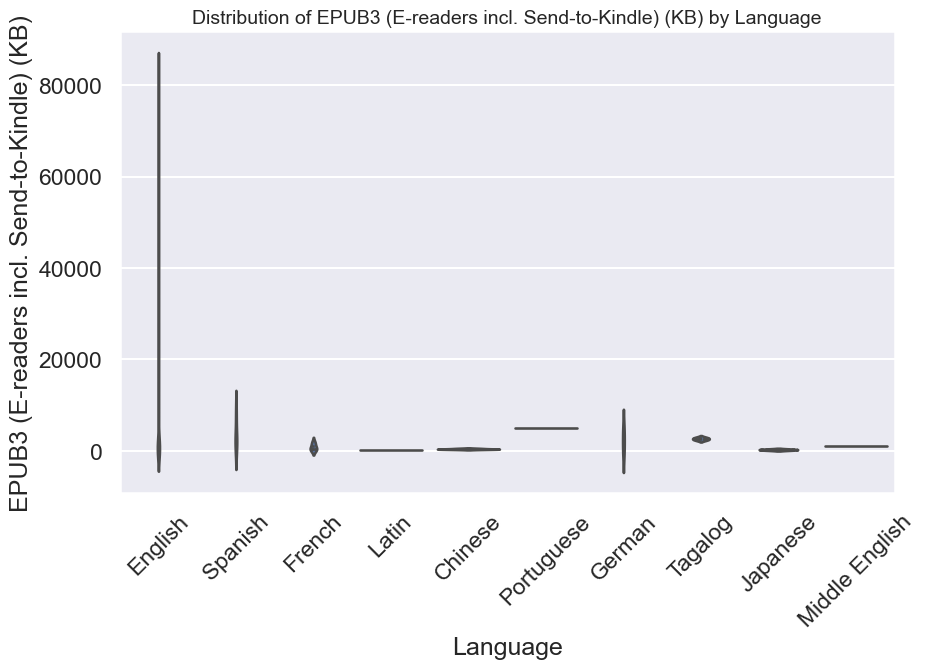

C:\Users\Hp\AppData\Local\Temp\ipykernel_17928\4260186120.py:32: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x=cat, y=num, data=final_df, estimator="mean", ci=None)


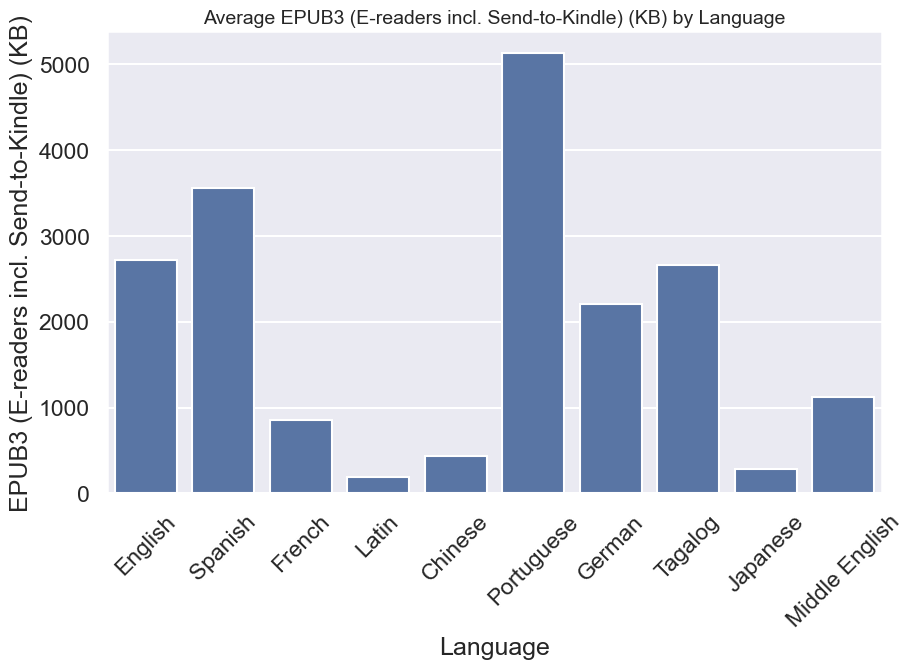

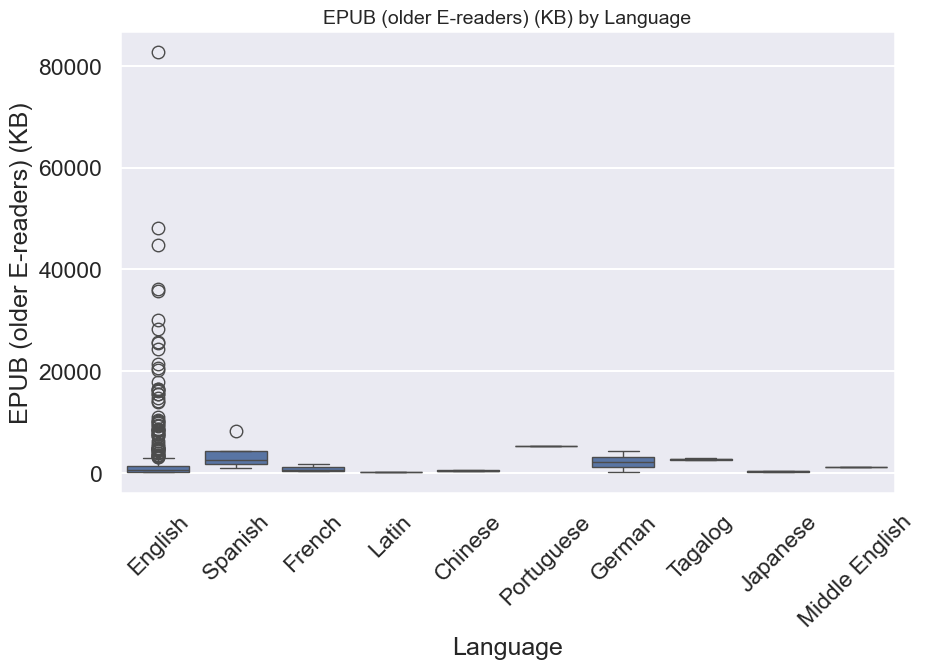

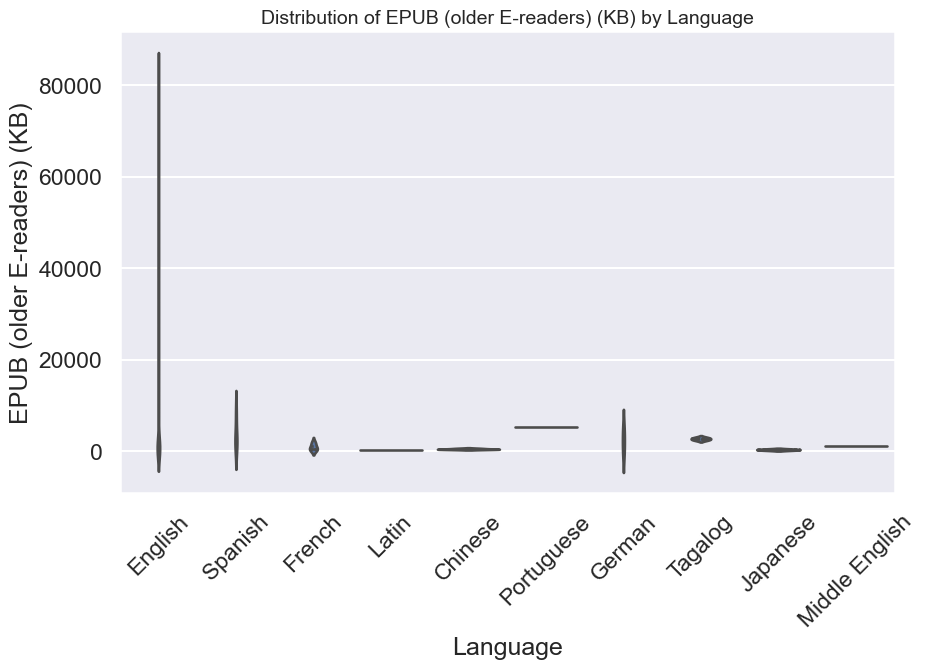

C:\Users\Hp\AppData\Local\Temp\ipykernel_17928\4260186120.py:32: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x=cat, y=num, data=final_df, estimator="mean", ci=None)


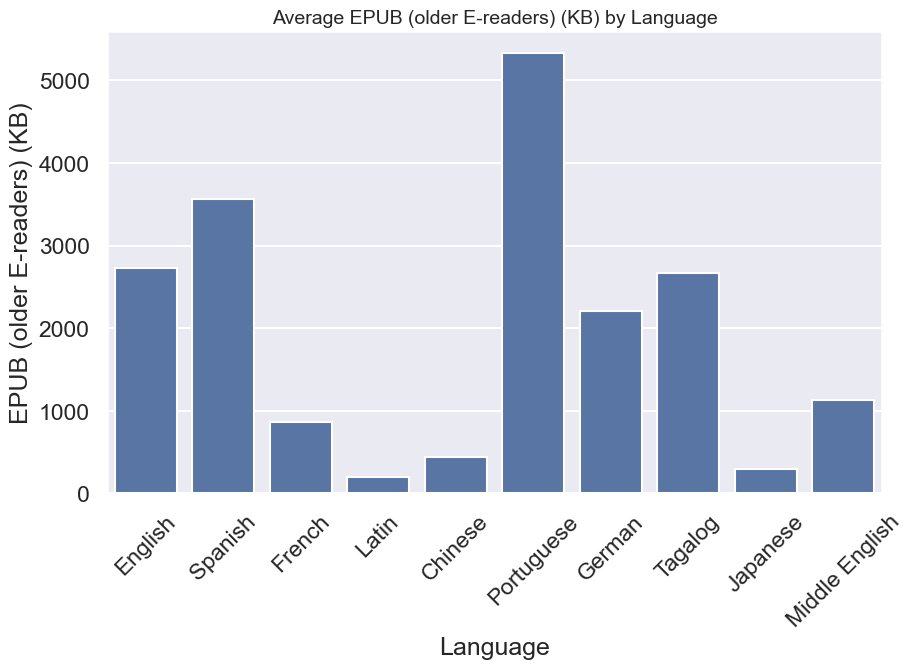

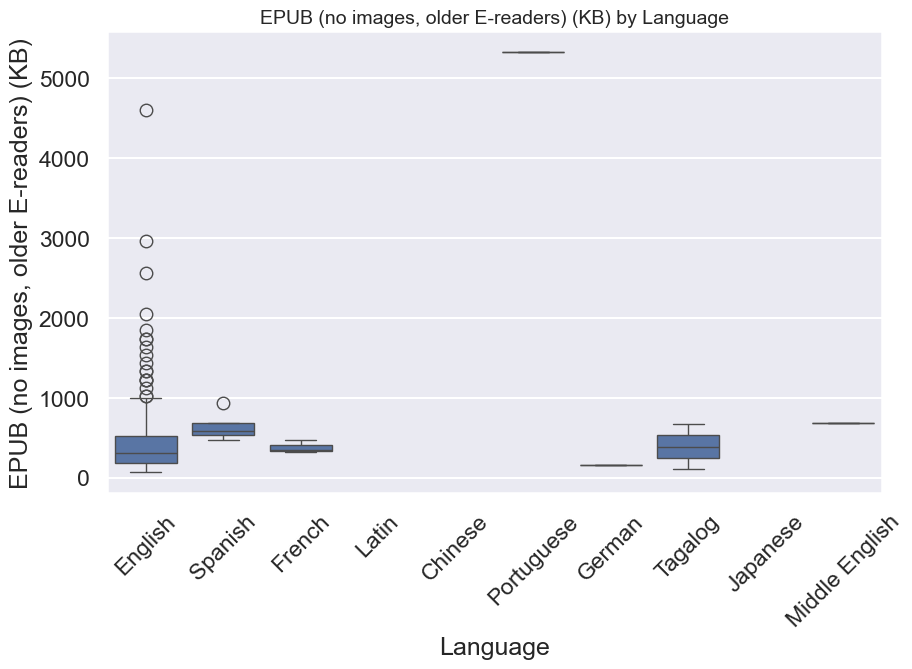

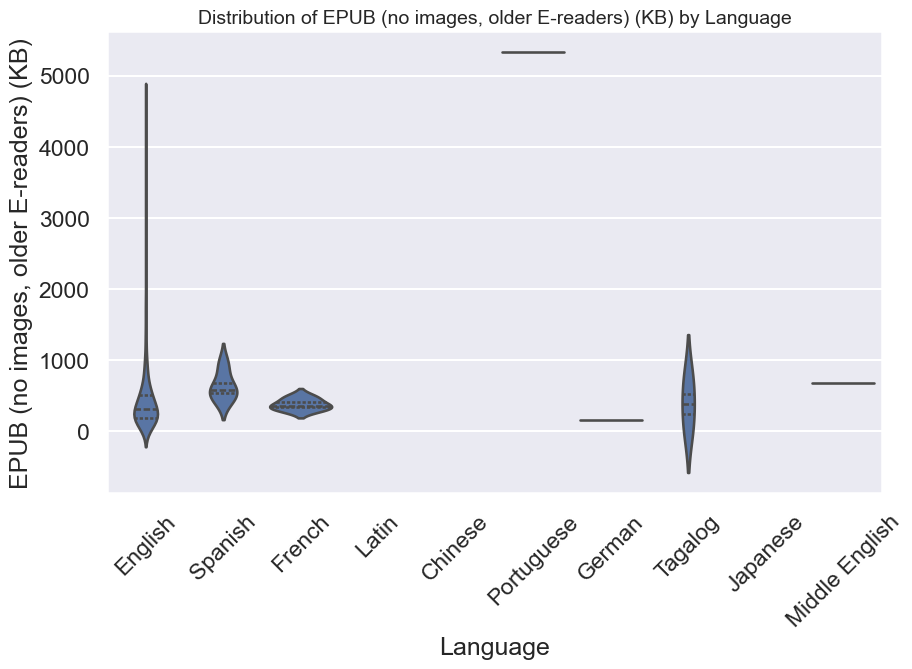

C:\Users\Hp\AppData\Local\Temp\ipykernel_17928\4260186120.py:32: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x=cat, y=num, data=final_df, estimator="mean", ci=None)


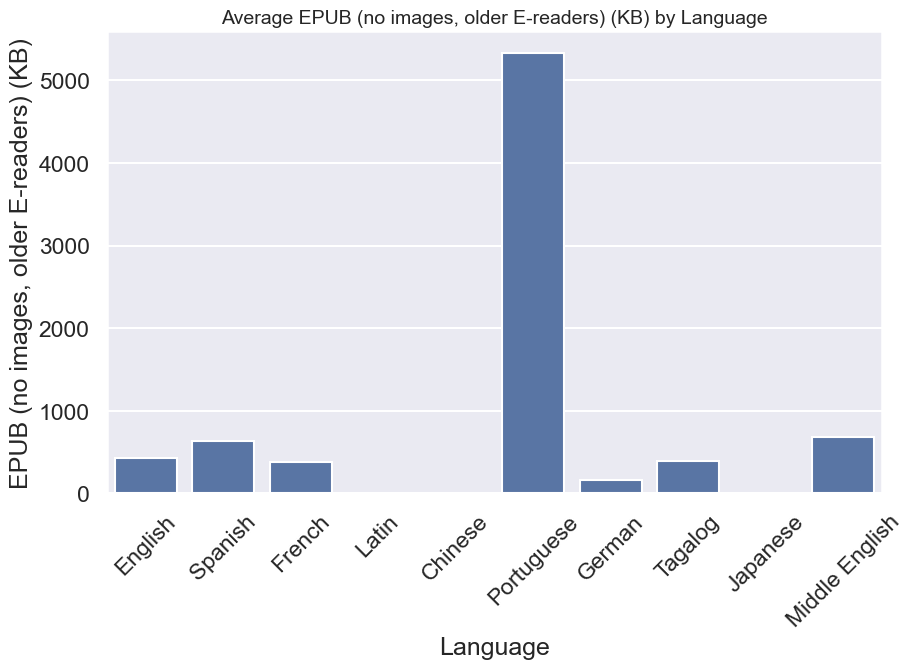

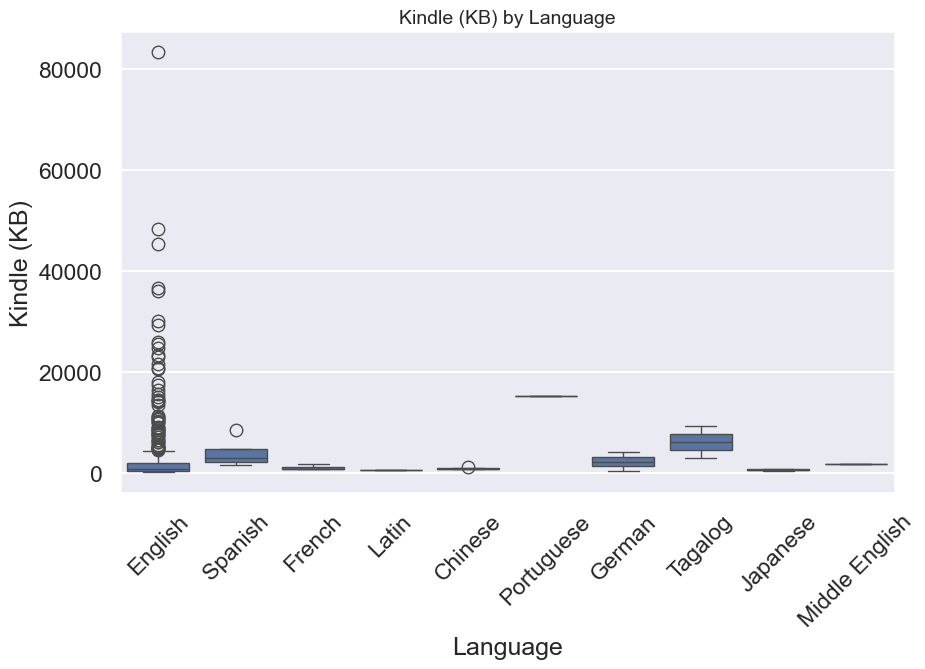

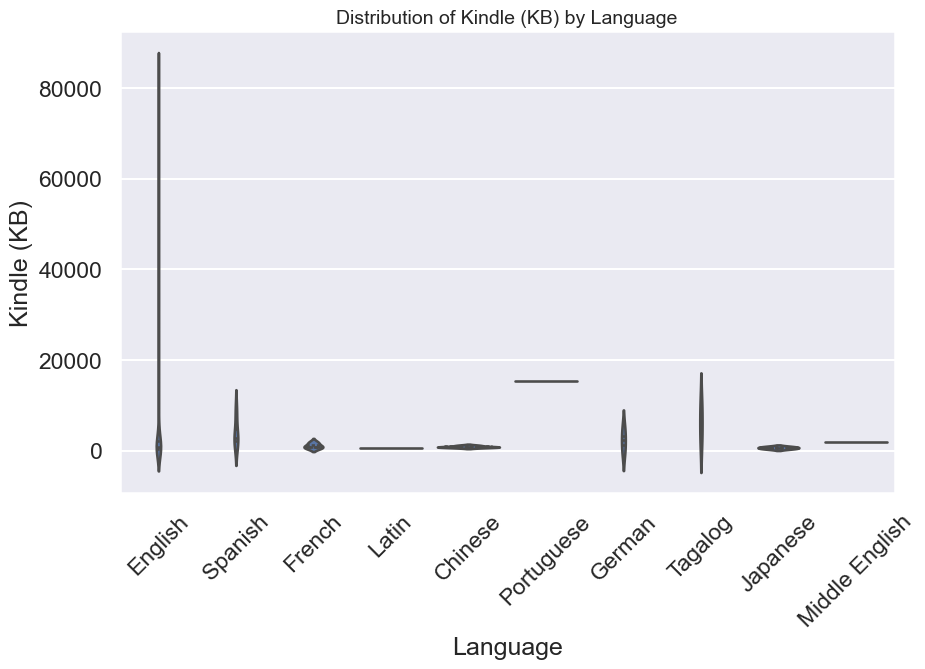

C:\Users\Hp\AppData\Local\Temp\ipykernel_17928\4260186120.py:32: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x=cat, y=num, data=final_df, estimator="mean", ci=None)


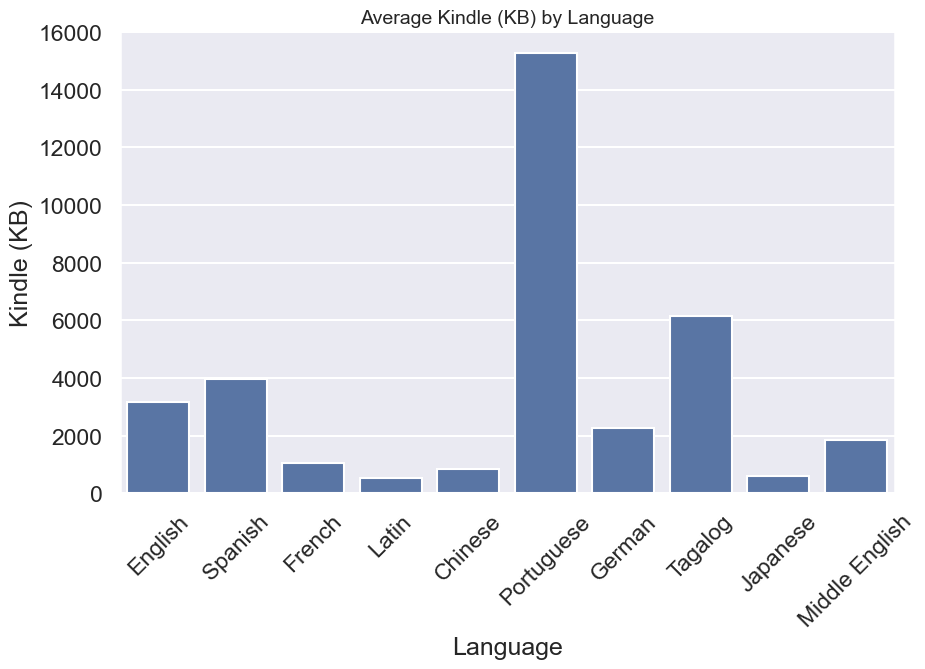

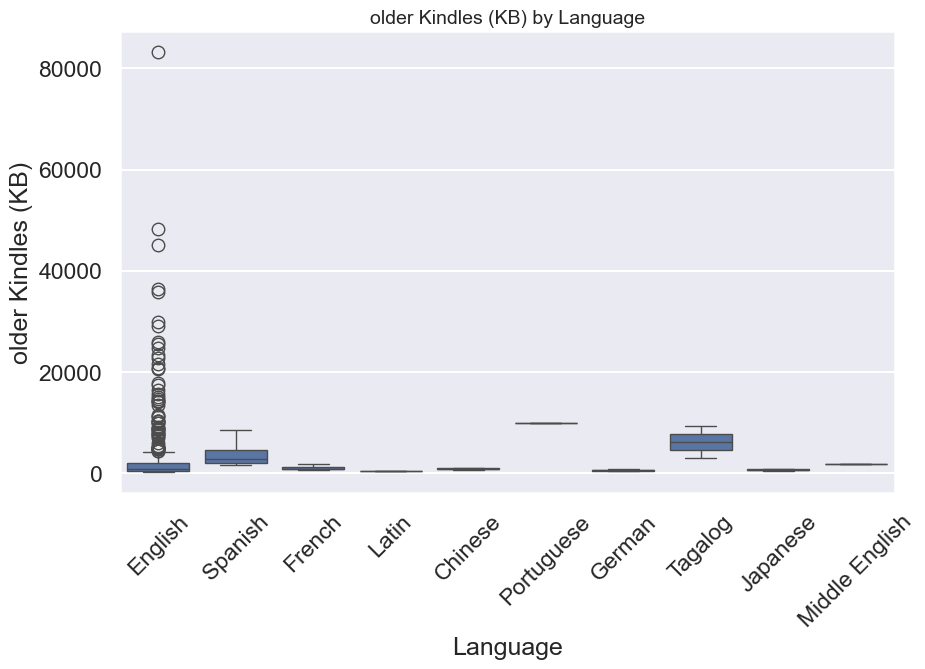

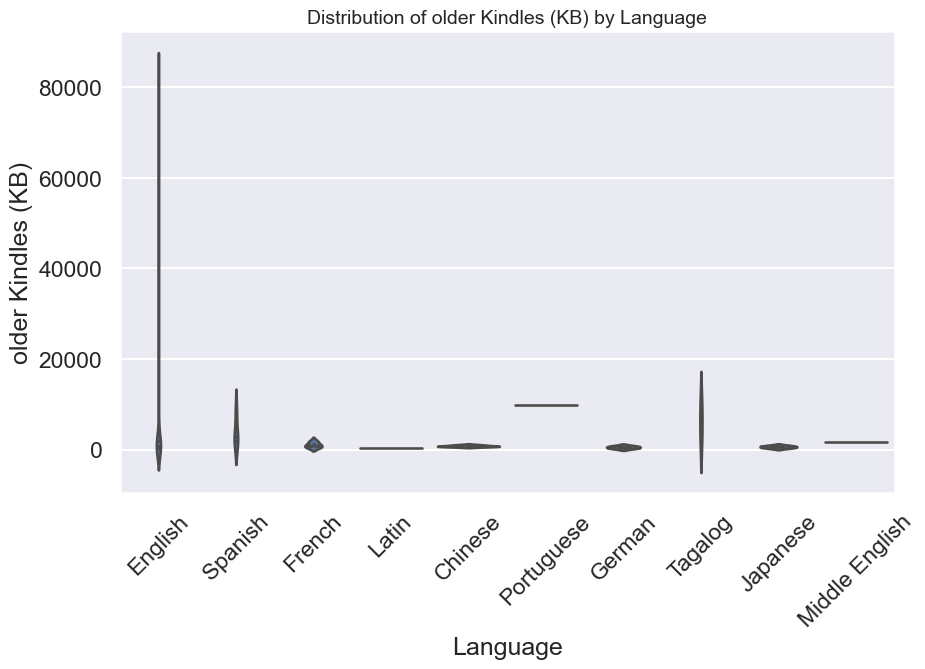

C:\Users\Hp\AppData\Local\Temp\ipykernel_17928\4260186120.py:32: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x=cat, y=num, data=final_df, estimator="mean", ci=None)


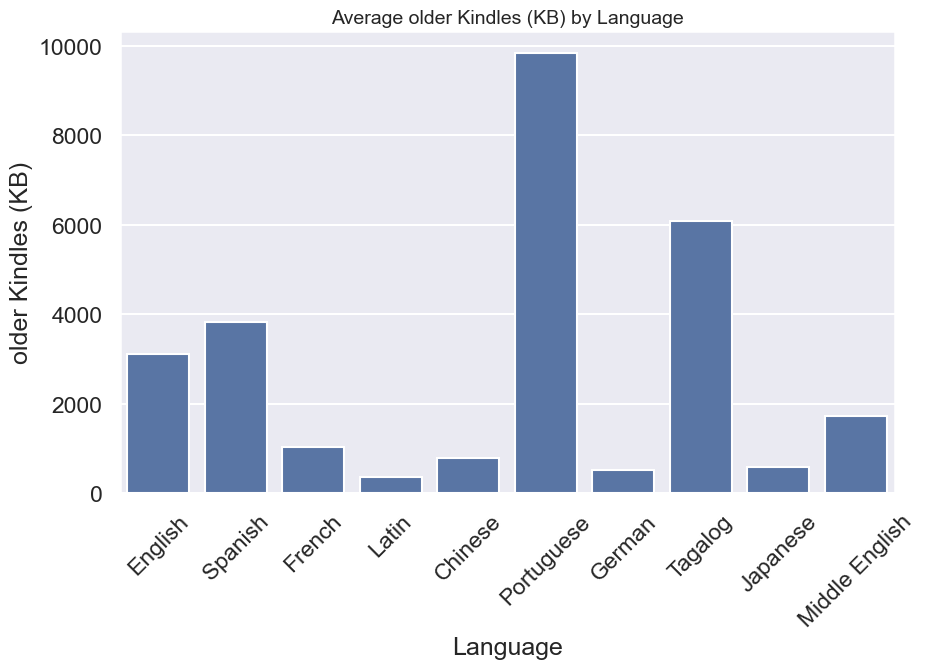

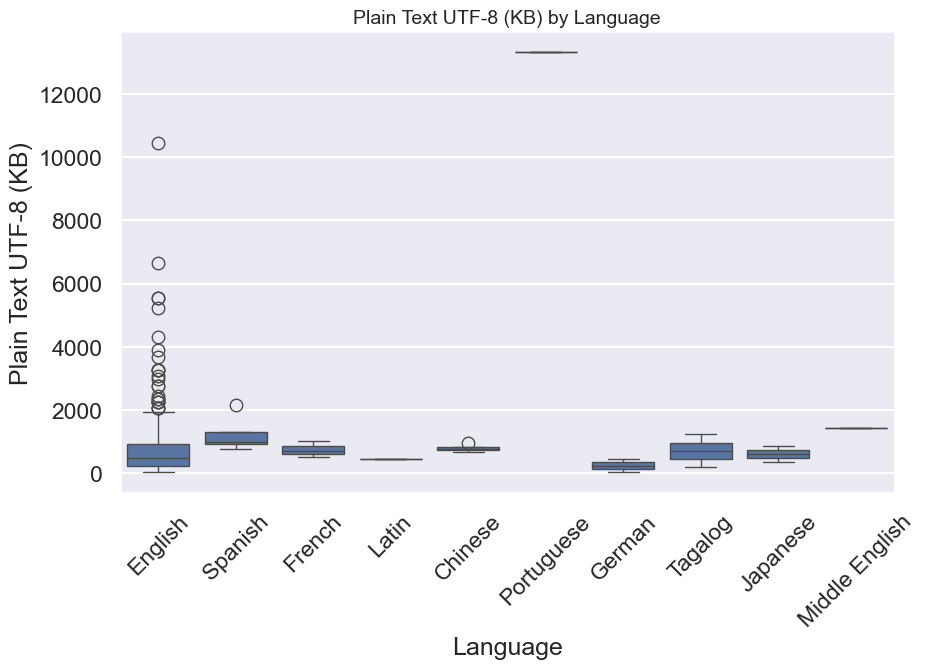

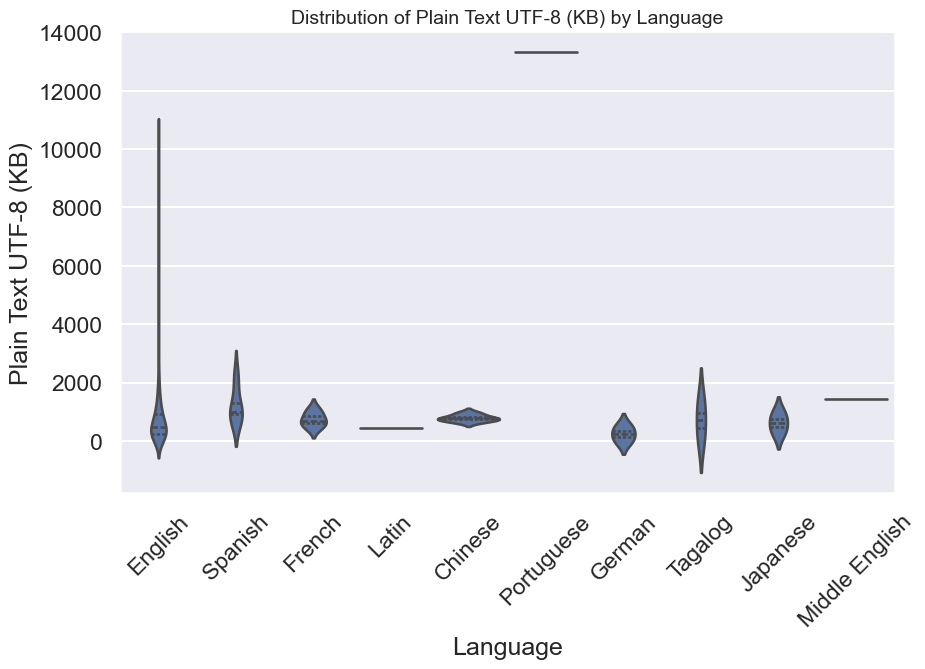

C:\Users\Hp\AppData\Local\Temp\ipykernel_17928\4260186120.py:32: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x=cat, y=num, data=final_df, estimator="mean", ci=None)


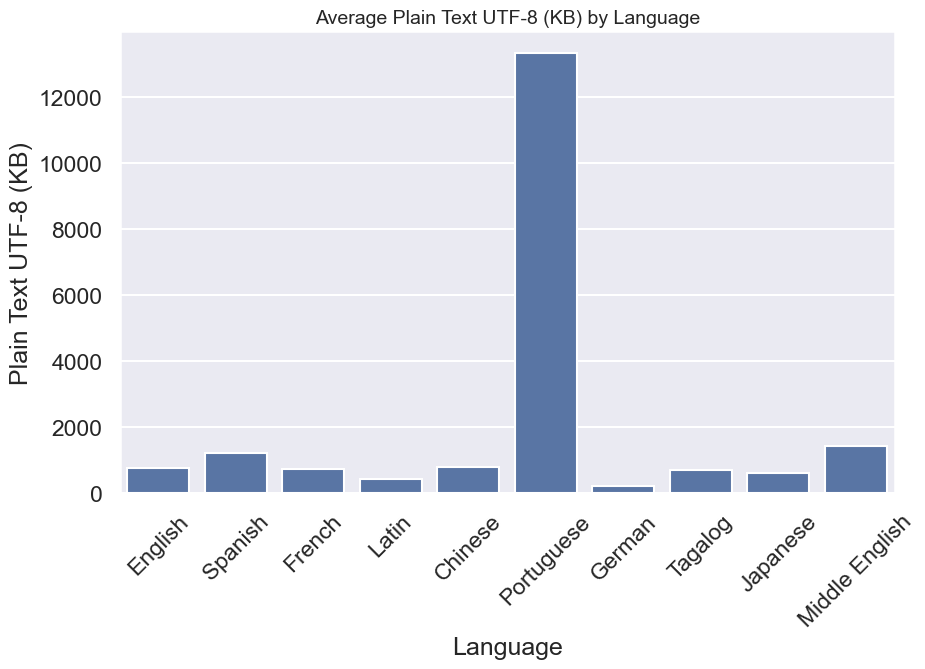

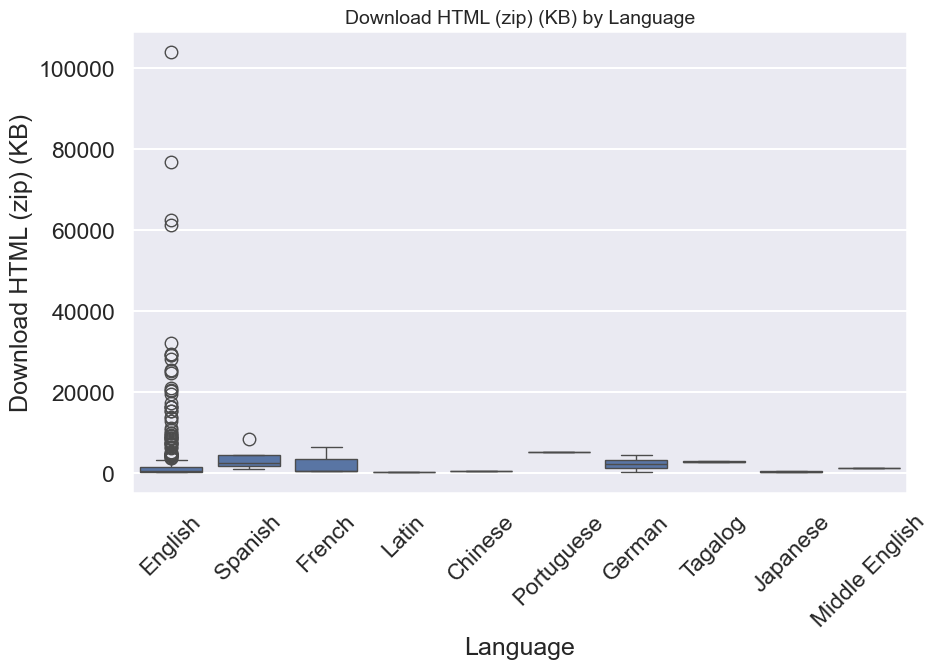

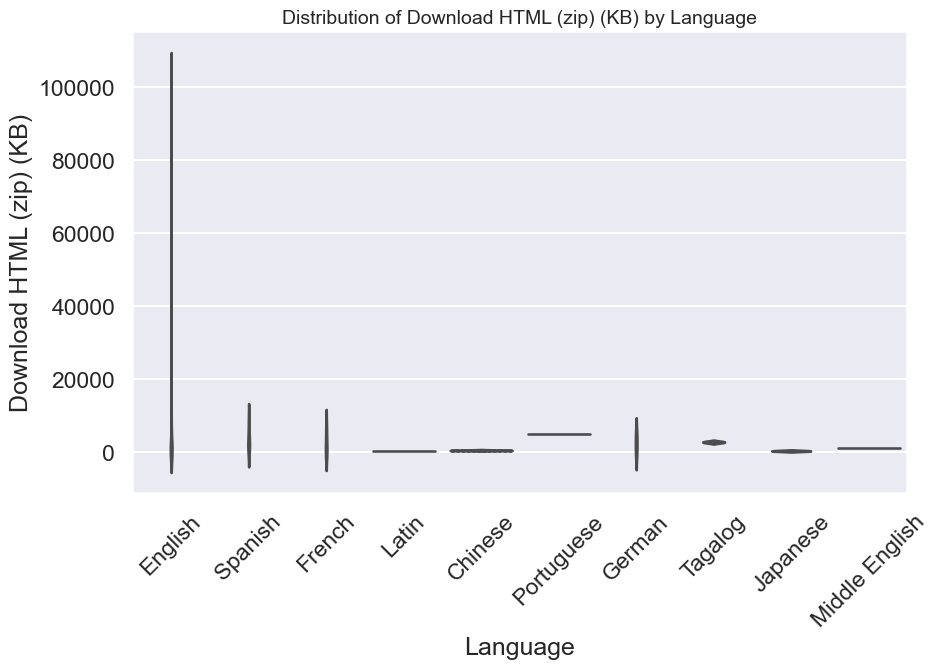

C:\Users\Hp\AppData\Local\Temp\ipykernel_17928\4260186120.py:32: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x=cat, y=num, data=final_df, estimator="mean", ci=None)


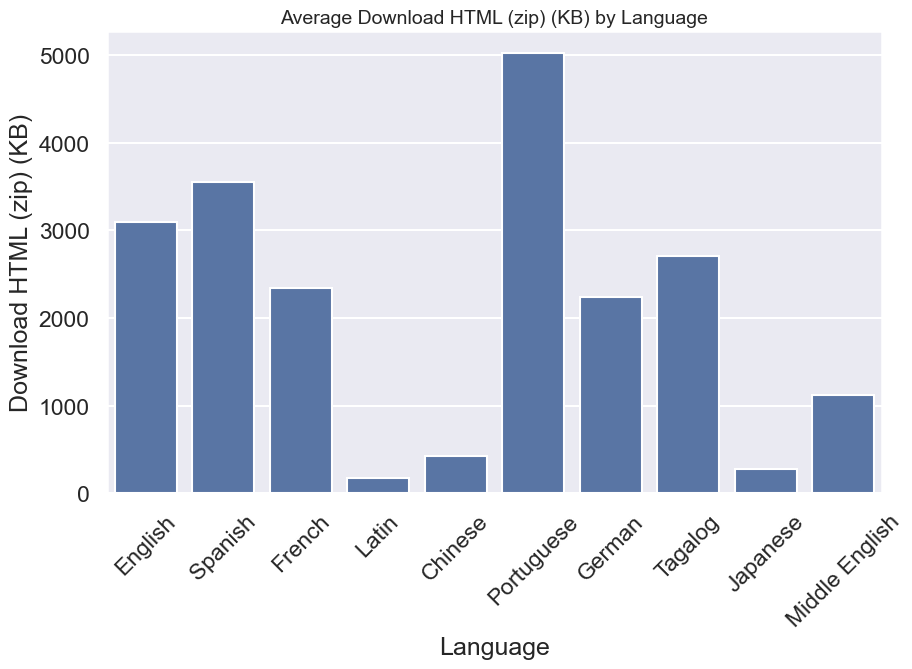

In [52]:
import matplotlib.pyplot as plt
import seaborn as sns

# --- Step 1: Identify columns ---
num_cols = final_df.select_dtypes(include=['int64', 'float64']).columns.tolist()
cat_cols = final_df.select_dtypes(include=['object']).columns.tolist()

print("Numerical Columns:", num_cols)
print("Categorical Columns:", cat_cols)

# --- Step 2: Choose categorical columns to analyze ---
# Pick only categorical columns with a manageable number of unique values
selected_cat_cols = [col for col in cat_cols if final_df[col].nunique() < 15]  # example threshold
print("Selected categorical columns for analysis:", selected_cat_cols)

# --- Step 3: Univariate analysis (Numerical vs Categorical) ---
for cat in selected_cat_cols:
    for num in num_cols:
        plt.figure(figsize=(10,6))
        sns.boxplot(x=cat, y=num, data=final_df)
        plt.title(f"{num} by {cat}", fontsize=14)
        plt.xticks(rotation=45)
        plt.show()

        plt.figure(figsize=(10,6))
        sns.violinplot(x=cat, y=num, data=final_df, inner="quart")
        plt.title(f"Distribution of {num} by {cat}", fontsize=14)
        plt.xticks(rotation=45)
        plt.show()

        plt.figure(figsize=(10,6))
        sns.barplot(x=cat, y=num, data=final_df, estimator="mean", ci=None)
        plt.title(f"Average {num} by {cat}", fontsize=14)
        plt.xticks(rotation=45)
        plt.show()



## Bivariate analysis on numerical columns

In [57]:
num_cols = final_df.select_dtypes(include=["int64", "float64"]).columns.tolist()
print("Numerical columns:", num_cols)

Numerical columns: ['Book ID', 'Downloads (30 days)', 'Read now! (KB)', 'EPUB3 (E-readers incl. Send-to-Kindle) (KB)', 'EPUB (older E-readers) (KB)', 'EPUB (no images, older E-readers) (KB)', 'Kindle (KB)', 'older Kindles (KB)', 'Plain Text UTF-8 (KB)', 'Download HTML (zip) (KB)']


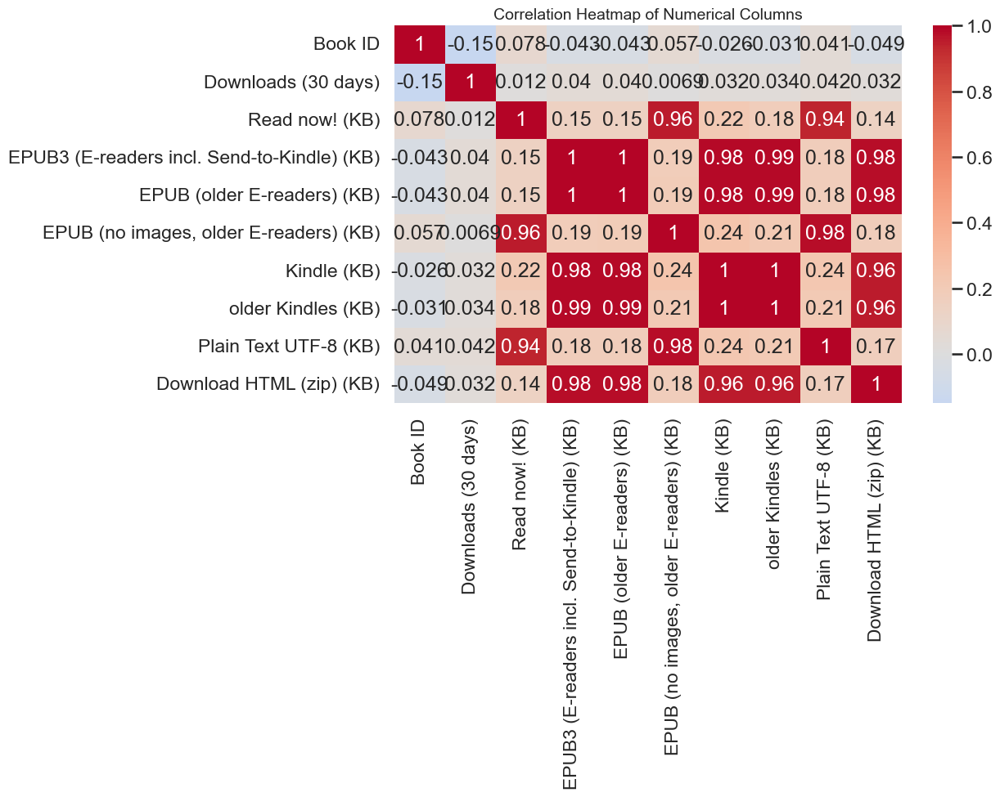

In [58]:
plt.figure(figsize=(10,6))
sns.heatmap(final_df[num_cols].corr(), annot=True, cmap="coolwarm", center=0)
plt.title("Correlation Heatmap of Numerical Columns", fontsize=14)
plt.show()

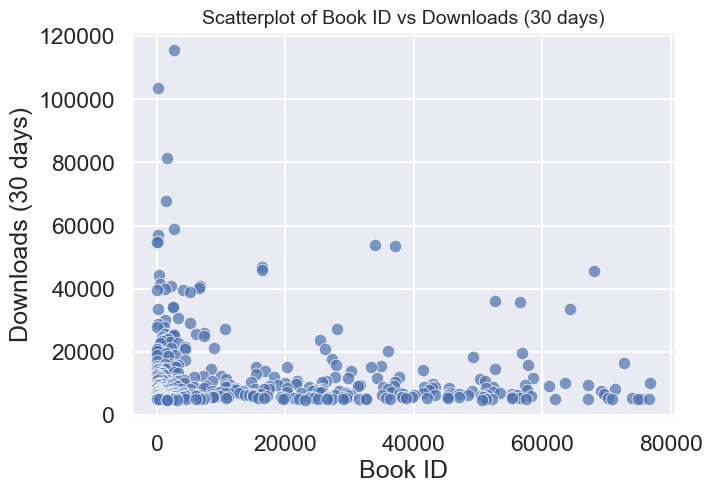

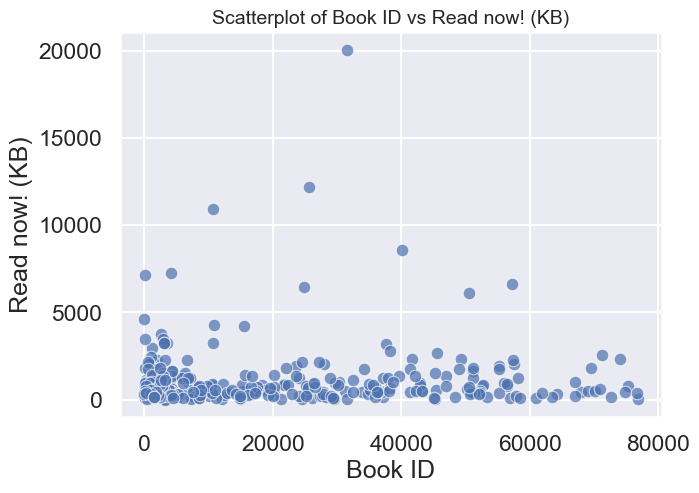

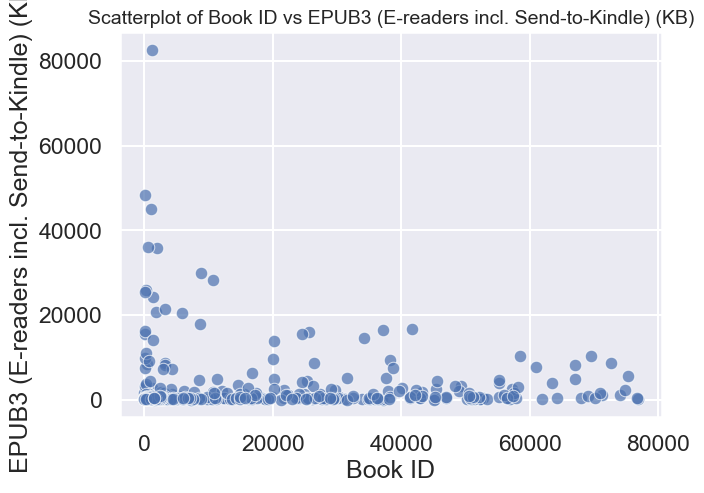

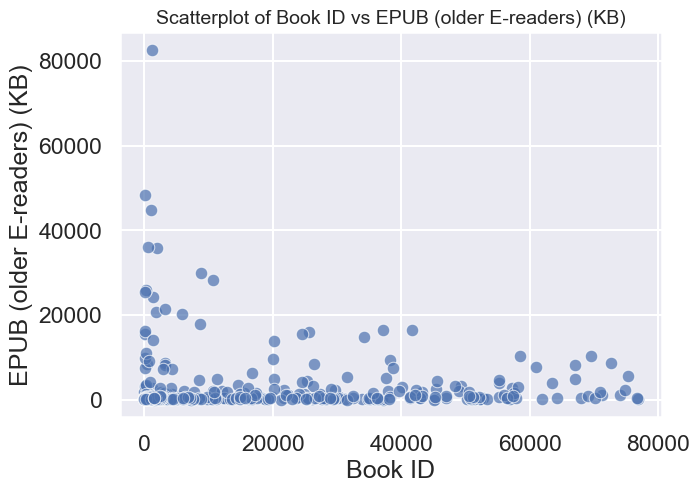

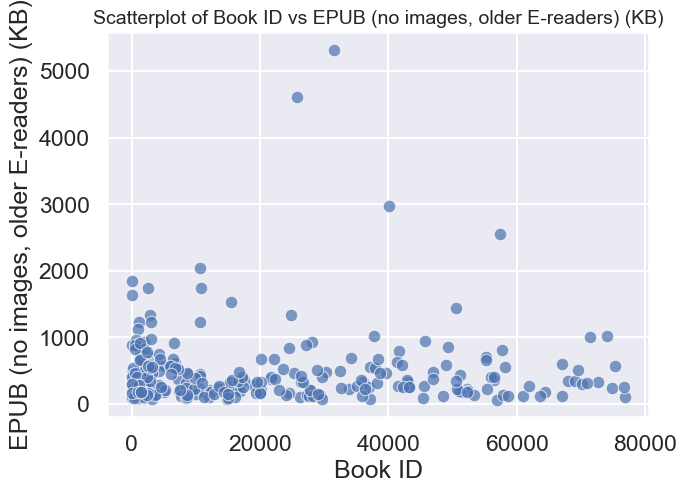

...

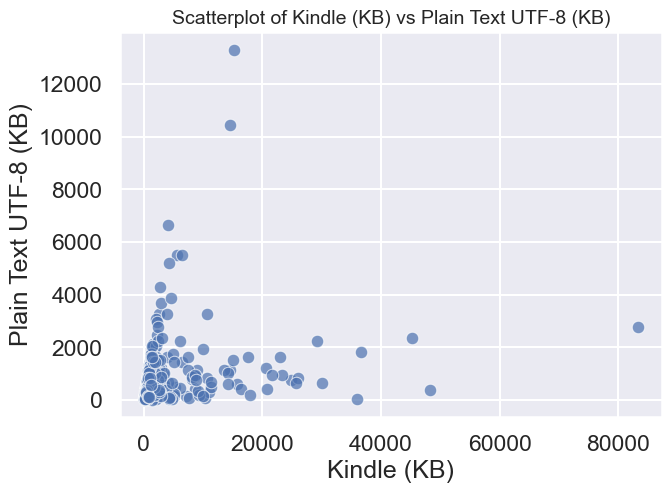

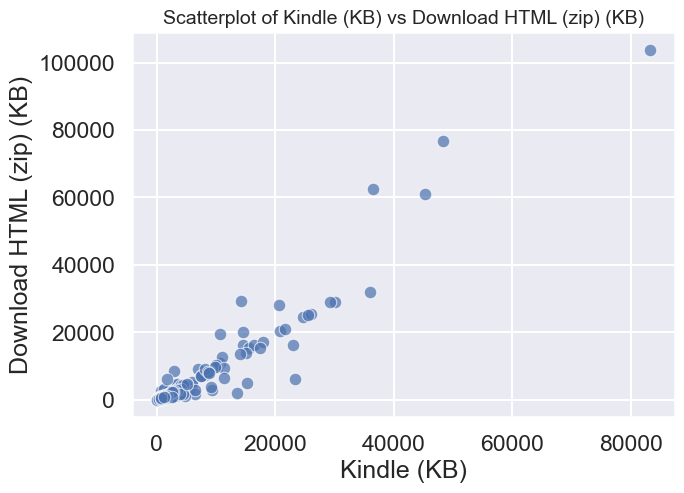

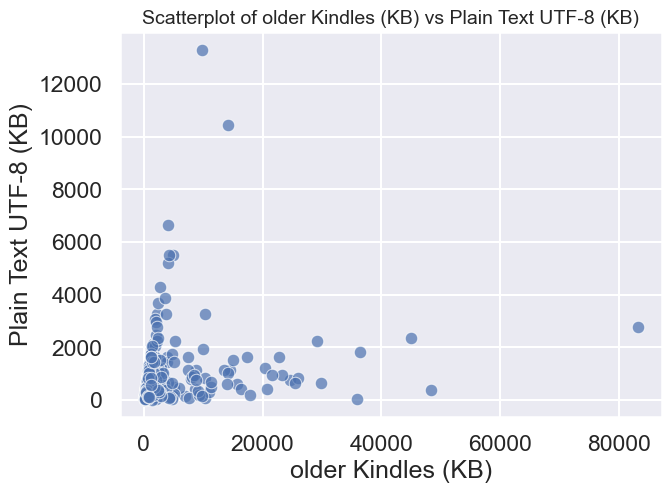

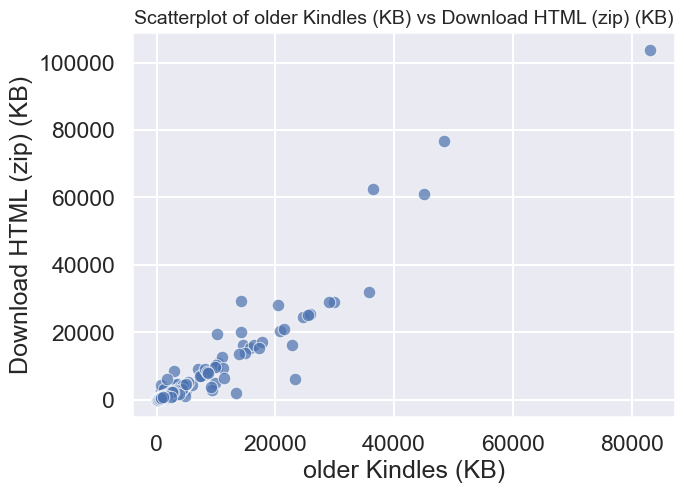

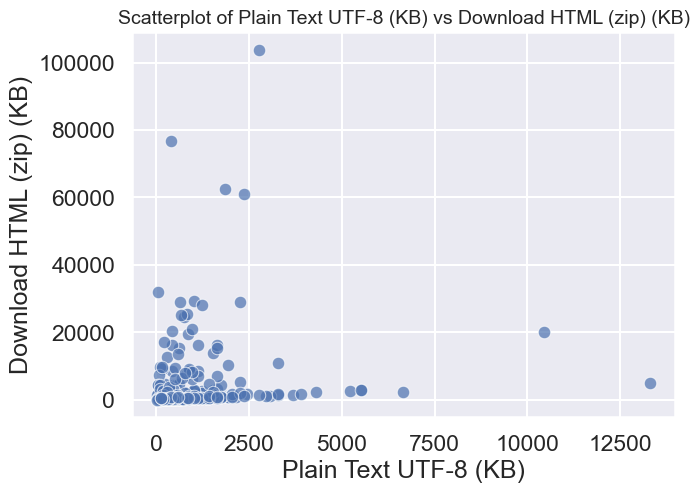

In [60]:
for i in range(len(num_cols)):
    for j in range(i+1, len(num_cols)):
        col1, col2 = num_cols[i], num_cols[j]
        plt.figure(figsize=(7,5))
        sns.scatterplot(data=final_df, x=col1, y=col2, alpha=0.7)
        plt.title(f"Scatterplot of {col1} vs {col2}", fontsize=14)
        plt.show()


C:\Users\Hp\AppData\Local\Temp\ipykernel_17928\2909283793.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=final_df, x="bins", y=col2, palette="Set2")


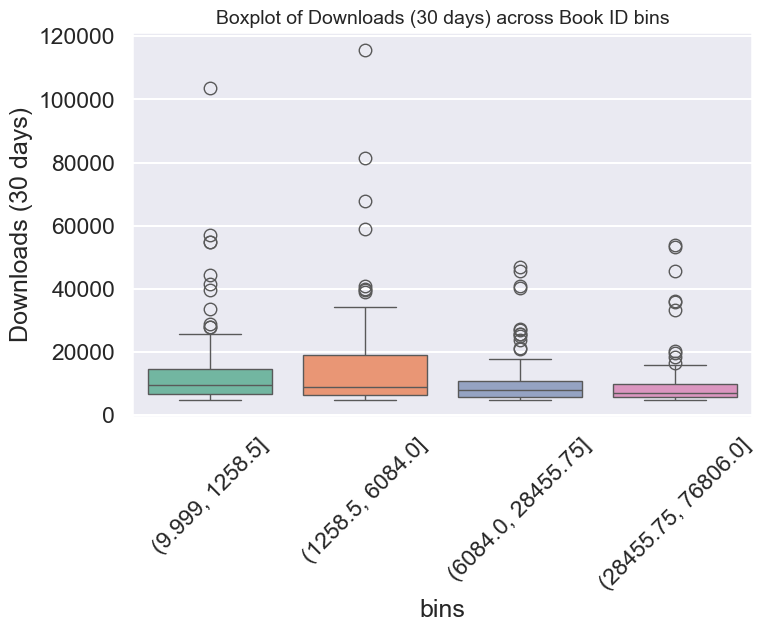

In [61]:
if len(num_cols) >= 2:
    col1, col2 = num_cols[0], num_cols[1]  # Example: first two numeric cols
    # Create bins of col1
    final_df["bins"] = pd.qcut(final_df[col1], q=4, duplicates="drop")
    
    plt.figure(figsize=(8,5))
    sns.boxplot(data=final_df, x="bins", y=col2, palette="Set2")
    plt.title(f"Boxplot of {col2} across {col1} bins", fontsize=14)
    plt.xticks(rotation=45)
    plt.show()

    # Drop the helper column after use
    final_df.drop(columns="bins", inplace=True)

## Bivariate analysis on categorical columns 

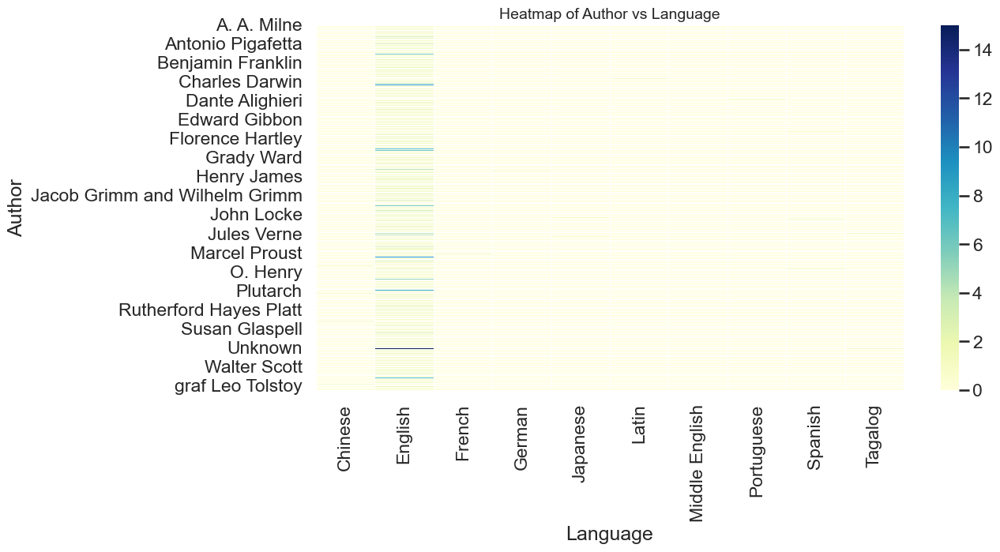

In [62]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Example: Author vs Language (replace with your actual categorical columns)
cross_tab = pd.crosstab(data['Author'], data['Language'])

plt.figure(figsize=(12,6))
sns.heatmap(cross_tab, cmap="YlGnBu", linewidths=0.5)
plt.title("Heatmap of Author vs Language", fontsize=14)
plt.show()


### Non visualized analysis of heatmap of author vs language

In [100]:
import pandas as pd

# Create crosstab of Author vs Language
cross_tab = pd.crosstab(data['Author'], data['Language'])

print("Crosstab table: Author vs Language (counts)")
print(cross_tab)

# Optional: calculate row-wise percentages
cross_tab_percent = cross_tab.div(cross_tab.sum(axis=1), axis=0) * 100
cross_tab_percent = cross_tab_percent.round(2)

print("\nCrosstab table: Author vs Language (row-wise percentages)")
cross_tab_percent


Crosstab table: Author vs Language (counts)
Language                       Chinese  English  French  German  Japanese  Latin  Middle English  Portuguese  Spanish  Tagalog
Author                                                                                                                        
A. A. Milne                          0        1       0       0         0      0               0           0        0        0
A. W. Tozer                          0        1       0       0         0      0               0           0        0        0
Adam Smith                           0        1       0       0         0      0               0           0        0        0
Aesop                                0        2       0       0         0      0               0           0        0        0
Agatha Christie                      0        2       0       0         0      0               0           0        0        0
...                                ...      ...     ...     ...    

Language,Chinese,English,French,German,Japanese,Latin,Middle English,Portuguese,Spanish,Tagalog
Author,,,,,,,,,,
A. A. Milne,0.0,100.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
A. W. Tozer,0.0,100.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Adam Smith,0.0,100.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Aesop,0.0,100.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Agatha Christie,0.0,100.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...
Xun Lu,100.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
active 6th century B.C. Sunzi,0.0,100.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
graf Leo Tolstoy,0.0,100.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


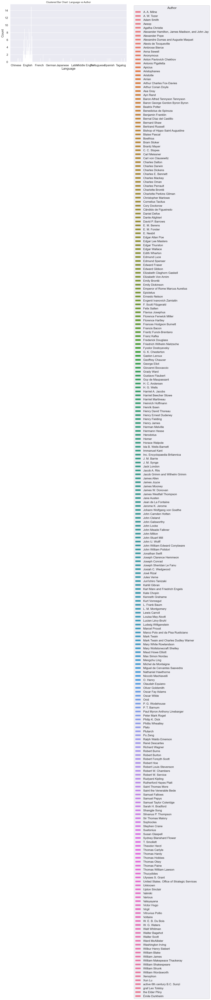

In [57]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Create cross tab
cross_tab = pd.crosstab(data['Language'], data['Author']).reset_index().head(10)

# Melt to long format for seaborn
cross_tab_melted = cross_tab.melt(id_vars='Language', var_name='Author', value_name='Count')

# Plot with seaborn
plt.figure(figsize=(12,6))
sns.barplot(data=cross_tab_melted, x='Language', y='Count', hue='Author')
plt.title("Clustered Bar Chart: Language vs Author", fontsize=14)
plt.ylabel("Count")
plt.xlabel("Language")
plt.legend(title="Author", bbox_to_anchor=(1.05,1))
plt.show()


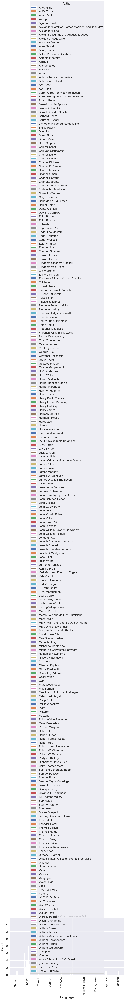

In [65]:
cross_tab = pd.crosstab(data['Language'], data['Author'])
cross_tab.plot(kind='bar', figsize=(12,6))
plt.title("Clustered Bar Chart: Language vs Author", fontsize=14)
plt.ylabel("Count")
plt.show()


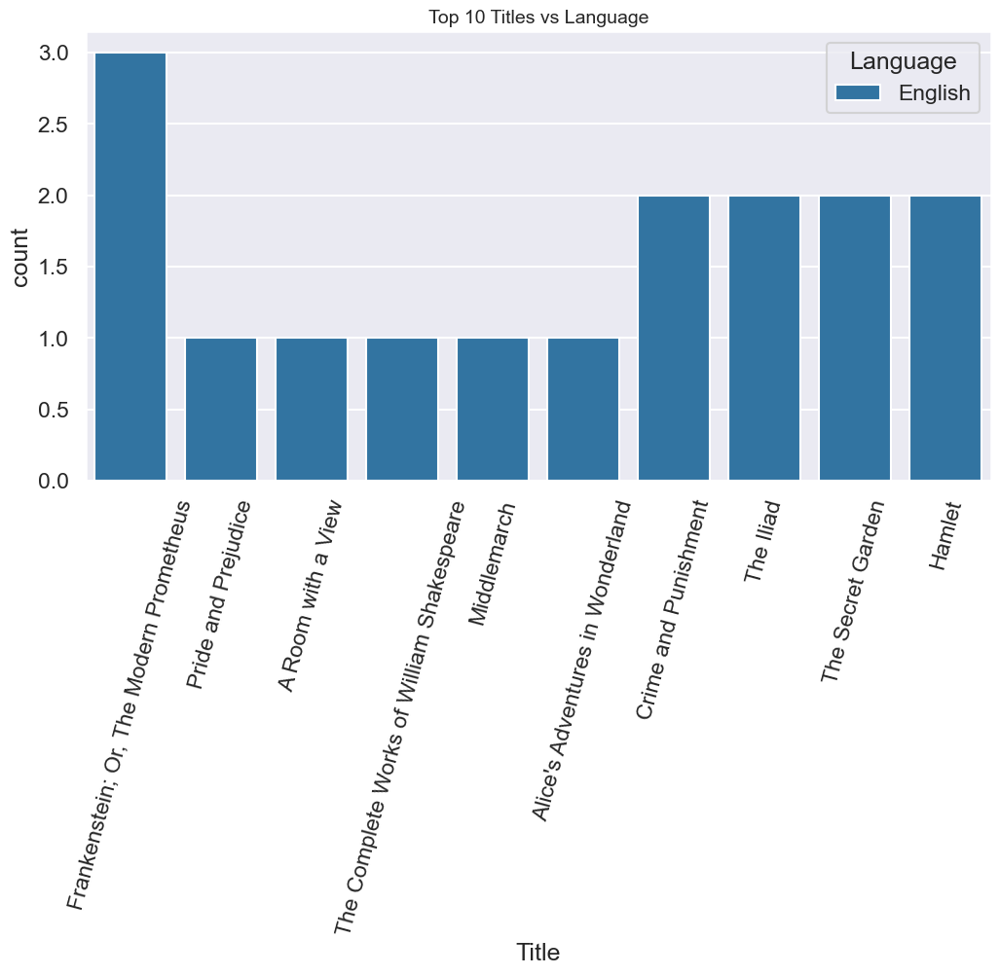

In [71]:
import seaborn as sns
import matplotlib.pyplot as plt

# pick top 10 titles by frequency
top_titles = data['Title'].value_counts().nlargest(10).index
subset = data[data['Title'].isin(top_titles)]

plt.figure(figsize=(12,6))
sns.countplot(data=subset, x="Title", hue="Language", palette="tab10")
plt.xticks(rotation=75)
plt.title("Top 10 Titles vs Language", fontsize=14)
plt.show()


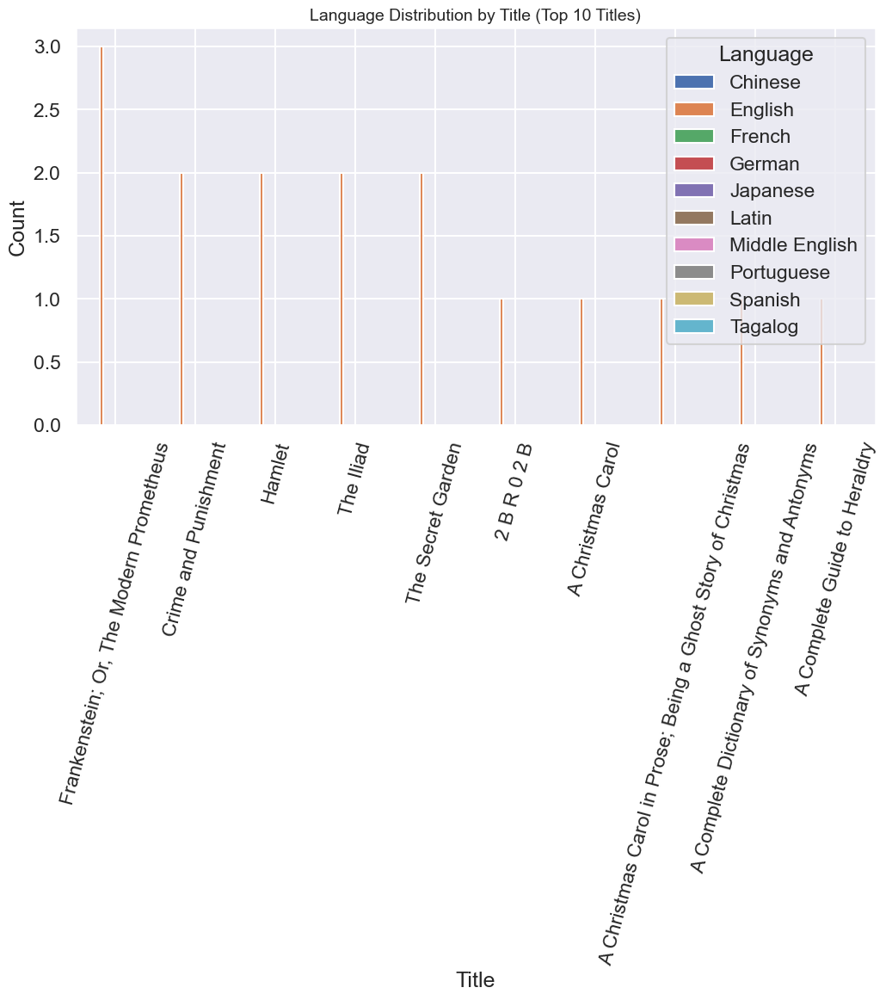

In [72]:
cross_tab = pd.crosstab(data['Title'], data['Language'])

# only keep top 10 titles
cross_tab = cross_tab.loc[cross_tab.sum(axis=1).nlargest(10).index]

cross_tab.plot(kind='bar', figsize=(12,6))
plt.title("Language Distribution by Title (Top 10 Titles)", fontsize=14)
plt.ylabel("Count")
plt.xticks(rotation=75)
plt.show()


### Non visualization analysis for language distribution for title (top 10 titles)

In [101]:
import pandas as pd

# Create crosstab of Title vs Language
cross_tab = pd.crosstab(data['Title'], data['Language'])

# Keep only top 10 titles by total count
top10_titles = cross_tab.sum(axis=1).nlargest(10).index
cross_tab_top10 = cross_tab.loc[top10_titles]

print("Language distribution for Top 10 Titles (counts):")
print(cross_tab_top10)

# Optional: percentages per title
cross_tab_percent = cross_tab_top10.div(cross_tab_top10.sum(axis=1), axis=0) * 100
cross_tab_percent = cross_tab_percent.round(2)

print("\nLanguage distribution for Top 10 Titles (percentages):")
cross_tab_percent


Language distribution for Top 10 Titles (counts):
Language                                            Chinese  English  French  German  Japanese  Latin  Middle English  Portuguese  Spanish  Tagalog
Title                                                                                                                                              
Frankenstein; Or, The Modern Prometheus                   0        3       0       0         0      0               0           0        0        0
Crime and Punishment                                      0        2       0       0         0      0               0           0        0        0
Hamlet                                                    0        2       0       0         0      0               0           0        0        0
The Iliad                                                 0        2       0       0         0      0               0           0        0        0
The Secret Garden                                         0   

Language,Chinese,English,French,German,Japanese,Latin,Middle English,Portuguese,Spanish,Tagalog
Title,,,,,,,,,,
"Frankenstein; Or, The Modern Prometheus",0.0,100.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Crime and Punishment,0.0,100.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Hamlet,0.0,100.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
The Iliad,0.0,100.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
The Secret Garden,0.0,100.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2 B R 0 2 B,0.0,100.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
A Christmas Carol,0.0,100.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
A Christmas Carol in Prose; Being a Ghost Story of Christmas,0.0,100.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
A Complete Dictionary of Synonyms and Antonyms,0.0,100.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


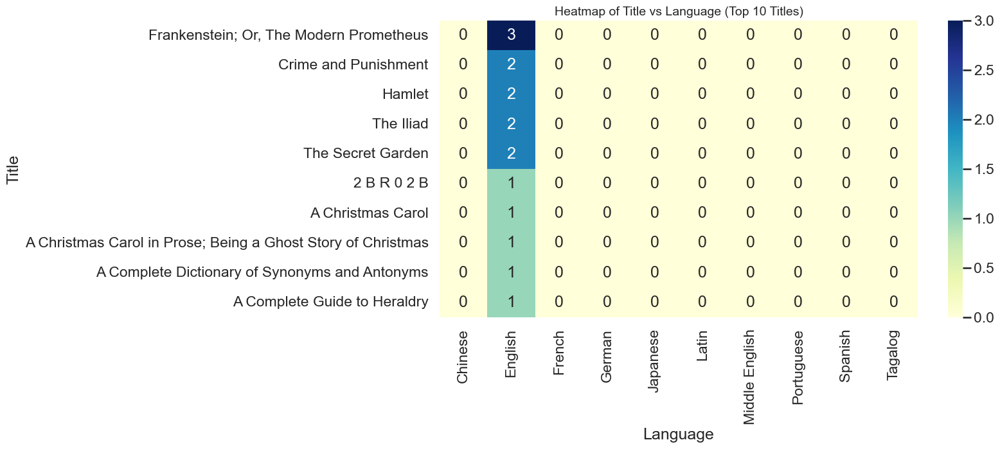

In [73]:
plt.figure(figsize=(12,6))
sns.heatmap(cross_tab, cmap="YlGnBu", annot=True, fmt="d")
plt.title("Heatmap of Title vs Language (Top 10 Titles)", fontsize=14)
plt.ylabel("Title")
plt.xlabel("Language")
plt.show()


## Bivariate analysis on numerical vs numerical columns 

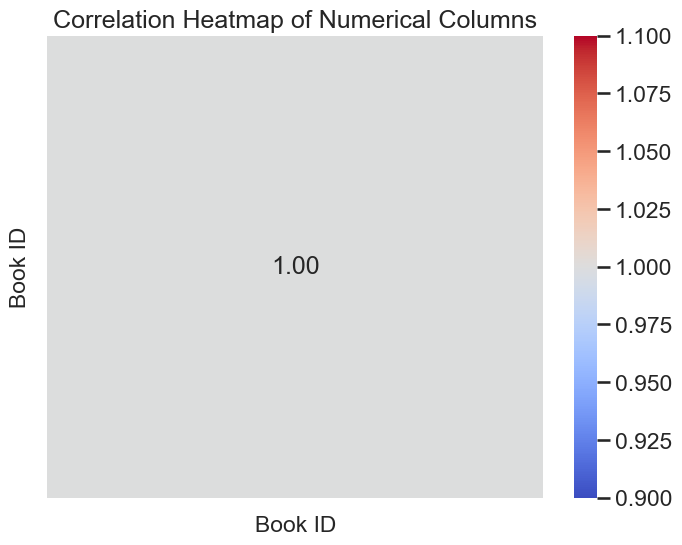

In [77]:
num_df = data.select_dtypes(include=np.number)

plt.figure(figsize=(8,6))
sns.heatmap(num_df.corr(), annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Correlation Heatmap of Numerical Columns")
plt.show()


### Non visualized analysis for corelation heatmap of numerical columns

In [102]:
import pandas as pd
import numpy as np

# Select numeric columns
num_df = data.select_dtypes(include=np.number)

# Compute correlation matrix
corr_matrix = num_df.corr()

# Display correlation matrix
print("Correlation matrix of numerical columns:")
corr_matrix

# Optional: save to CSV for reporting
# corr_matrix.to_csv("numeric_columns_correlation.csv")


Correlation matrix of numerical columns:


,Book ID
Book ID,1.0


## Bivariate analysis on categorical vs categorical columns


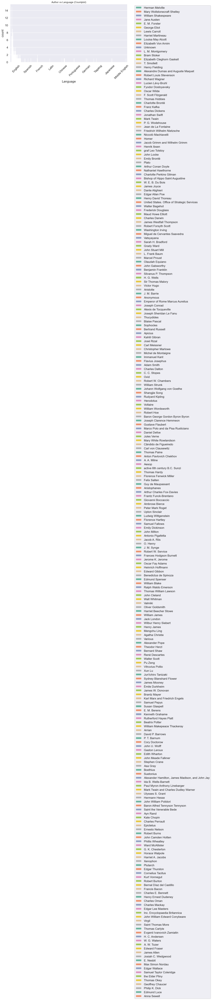

In [86]:
plt.figure(figsize=(12,6))
sns.countplot(data=data, x="Language", hue="Author", palette="Set2")
plt.title("Author vs Language (Countplot)", fontsize=14)
plt.xticks(rotation=45)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')  # move legend outside
plt.show()
